In [1]:
import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pylab

import folium
from folium import plugins
import geocoder
import ipywidgets

from scipy.stats import ttest_rel
from scipy.stats import ttest_ind

import statsmodels.api as sm
from statsmodels.formula.api import ols

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LassoCV
from sklearn.linear_model import RidgeCV
from sklearn.metrics import mean_squared_error as rmse
from sklearn.metrics import r2_score as r2

from yellowbrick.regressor import ResidualsPlot

# Que parametros determinan el precio de un jugador de futbol?

Para ello vamos a realizar una regresion lineal pero primero vamos a obtener nuestra data, leerla, entenderla, limpiarla, analizarla y visualizarla antes de poder contestar a nuestra pregunta.

## Obtencion de Datos. 

Los datos fueron adquiridos desde Kaggle: https://www.kaggle.com/stefanoleone992/fifa-22-complete-player-dataset?select=players_21.csv

Son datos de los jugadores de futbol del juego Fifa 22.

In [2]:
data = pd.read_csv(r'archive/players_22.csv', low_memory=False)
famous_club = pd.read_excel(r'archive/clubs.xlsx')

In [3]:
data.head()

,sofifa_id,player_url,short_name,long_name,player_positions,overall,potential,value_eur,wage_eur,age,...,lcb,cb,rcb,rb,gk,player_face_url,club_logo_url,club_flag_url,nation_logo_url,nation_flag_url
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,"RW, ST, CF",93,93,78000000,320000,34,...,50+3,50+3,50+3,61+3,19+3,https://cdn.sofifa.com/players/158/023/22_120.png,https://cdn.sofifa.com/teams/73/60.png,https://cdn.sofifa.com/flags/fr.png,https://cdn.sofifa.com/teams/1369/60.png,https://cdn.sofifa.com/flags/ar.png
1,188545,https://sofifa.com/player/188545/robert-lewand...,R. Lewandowski,Robert Lewandowski,ST,92,92,119500000,270000,32,...,60+3,60+3,60+3,61+3,19+3,https://cdn.sofifa.com/players/188/545/22_120.png,https://cdn.sofifa.com/teams/21/60.png,https://cdn.sofifa.com/flags/de.png,https://cdn.sofifa.com/teams/1353/60.png,https://cdn.sofifa.com/flags/pl.png
2,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,"ST, LW",91,91,45000000,270000,36,...,53+3,53+3,53+3,60+3,20+3,https://cdn.sofifa.com/players/020/801/22_120.png,https://cdn.sofifa.com/teams/11/60.png,https://cdn.sofifa.com/flags/gb-eng.png,https://cdn.sofifa.com/teams/1354/60.png,https://cdn.sofifa.com/flags/pt.png
3,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Júnior,"LW, CAM",91,91,129000000,270000,29,...,50+3,50+3,50+3,62+3,20+3,https://cdn.sofifa.com/players/190/871/22_120.png,https://cdn.sofifa.com/teams/73/60.png,https://cdn.sofifa.com/flags/fr.png,NaN,https://cdn.sofifa.com/flags/br.png
4,192985,https://sofifa.com/player/192985/kevin-de-bruy...,K. De Bruyne,Kevin De Bruyne,"CM, CAM",91,91,125500000,350000,30,...,69+3,69+3,69+3,75+3,21+3,https://cdn.sofifa.com/players/192/985/22_120.png,https://cdn.sofifa.com/teams/10/60.png,https://cdn.sofifa.com/flags/gb-eng.png,https://cdn.sofifa.com/teams/1325/60.png,https://cdn.sofifa.com/flags/be.png


## Procedemos a entender nuestro datos y los limpiamos

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19239 entries, 0 to 19238
Columns: 107 entries, sofifa_id to nation_flag_url
dtypes: float64(12), int64(45), object(50)
memory usage: 15.7+ MB


In [5]:
pd.set_option("display.max_rows", None,)
data.isnull().sum()

sofifa_id                          0
player_url                         0
short_name                         0
long_name                          0
player_positions                   0
overall                            0
potential                          0
value_eur                          0
wage_eur                           0
age                                0
dob                                0
height_cm                          0
weight_kg                          0
club_name                         61
league_name                     3314
league_level                    3314
club_position                     61
club_jersey_number                61
club_loaned_from               18137
club_joined                     1163
club_contract_valid_until         61
nationality                        0
nation_position                18480
nation_jersey_number           18480
preferred_foot                     0
weak_foot                          0
skill_moves                        0
i

In [6]:
pd.reset_option('^display.', silent=True)

Vamoa a estudiar los nulos de nuestros datos. El apartado de tags y traits no nos aporta nada a nuestro estudio (son rasgos de los jugadores en el juego que les permiten hacer ciertos movimientos) asi que eliminaremos las columnas. 

In [7]:
df = data.copy()
df.drop(['player_tags', 'player_traits'], axis=1, inplace=True)

En los que respecta a las variables que corresponde a los equipos nacionales, vamos a tirar national_jersey_number, ya que no nos intereza el number de la camiseta del jugador. Por otro lado, la columna de nation_position por si sola no nos dice nada la verdad, pero tiene la informacion de los jugadores que si juega para su seleccion y los que no asi q colocaremos 1 y 0 y le cambiaremos el nombre a la columna

In [8]:
df.drop(['nation_jersey_number', 'nation_position'], axis=1, inplace=True)

Los jugadores pueden negociar con el club a la hora de firmar el contrato si se incluye o no una clausula de recinsion. Si ambas partes estan de acuerdo puede que no exista y por lo tanto seria 0. 

Por otro lado tenemos varias columnas que no nos van a aportar informacion para el trabajo de este proyecto, las eliminaremos. 

In [9]:
df['release_clause_eur'].fillna(0, inplace=True)

df.drop(['club_joined', 'club_loaned_from', 'club_jersey_number', 'nation_flag_url', 'player_url',
        'nation_logo_url', 'club_flag_url', 'club_logo_url', 'player_face_url', 'sofifa_id', 'real_face'],
        axis=1, inplace=True)

Las columnas desde ls hasta rb, son siglas con los significados de las posiciones de los jugadores. Lesft Striker es ls, estas columnas nos dan los valores de los jugadores en cada una de las posiciones. Estos son datos que no nos sirven ya que el jugador sera utilizado en la posicion donde mejor se desempeña, es decir, no queremos saber como es Messi como portero porque obviamente no jugara tan bien. Por lo tanto, dropeamos dichas columnas.

In [10]:
df.drop(['ls', 'st', 'rs', 'lw', 'lf', 'cf', 'rf', 'lam', 'cam', 'ram',
        'lm', 'lcm', 'cm', 'rcm', 'rm', 'lwb', 'ldm', 'cdm', 'rdm', 'rwb',
        'lb', 'cb', 'rcb', 'rb', 'rw', 'lcb', 'gk'], axis=1, inplace=True)

A league_name le faltan muchos datos. Estos datos corresponde a jugadores de equipos importantes como el Real Madrid. Este error seguramente se produjo en la extracion de los datos. No se pueden dropear las filas por la importancia de los datos asi que se dropeara la columna

In [11]:
df.drop(['league_level', 'league_name'], axis=1, inplace=True)

Tenemos 2132 datos que faltan en las columnas de pace, shooting, passing, dribbling, defending y physic. Estos son los porteros que no se rigen por esas caracteristicas, por lo que volvemos 0 dichos valores. 

Por otro lado tenemos 17107 valores nulos en goalkeeping_speed. Estos valores corresponde a todos los jugadores que no son porteros los cuales no tienen este stat. Por lo tanto, lo volvemos 0

In [12]:
cols_drop = ['pace', 'shooting', 'passing', 'dribbling', 'defending', 'physic', 'goalkeeping_speed', ]

[df[i].fillna(0, inplace=True) for i in cols_drop]

[None, None, None, None, None, None, None]

Tenemos 61 datos nulos en club_name, club_position y club_contract_valid_until, estos son jugadores que no tiene club y por lo tanto son agentes libres. Para el estudio que vamos a realizar estos datos no nos sirve ya que son jugadores que no tienen precio.

Por otro lado, cambiaremos el nombre de la columnas dob para que se entienda mejor el tipo de dato que tiene

In [13]:
df.dropna(axis=0, inplace=True)
df.rename(columns={"dob": "born_date"}, inplace=True)

In [14]:
# Por otro lado, tenemos exactamente 13 jugadores que no valen nada, como se puede ver por la edad es algo esperable,
# son muy viejos y quiza sin mucho talento, lo que hace que nadie quiera compralos. O tambien pueden ser jugadores sin
# contrato

# Esto va a ser un problema para lo que queremos hacer asi que lo mejor sera dropearlos

df[df['value_eur'] == 0]

,short_name,long_name,player_positions,overall,potential,value_eur,wage_eur,age,born_date,height_cm,...,mentality_composure,defending_marking_awareness,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,goalkeeping_speed
1465,A. D'Alessandro,Andrés Nicolás D'Alessandro,"CAM, RM",75,75,0,900,40,1981-04-15,174,...,78,46,29,25,6,11,12,15,6,0.0
1471,J. Sand,José Gustavo Sand,ST,75,75,0,13000,40,1980-07-17,182,...,85,45,21,25,11,16,15,9,14,0.0
2429,M. Rodríguez,Maximiliano Rubén Rodríguez,"LW, LM, ST",73,73,0,10000,40,1981-01-02,173,...,86,57,30,26,15,11,15,9,9,0.0
5469,Rubén Castro,Rubén Castro Martín,ST,69,69,0,3000,40,1981-06-27,169,...,68,36,12,14,14,8,15,8,12,0.0
5479,L. Licht,Lucas Matías Licht,"LB, LWB, LM",69,69,0,5000,40,1981-04-06,174,...,72,69,71,69,8,14,6,15,8,0.0
7475,I. Öztürk,İbrahim Öztürk,CB,67,67,0,3000,40,1981-06-21,186,...,51,70,68,62,15,13,10,10,6,0.0
7478,P. Da Silva,Paulo César Da Silva Barrios,CB,67,67,0,500,41,1980-02-01,180,...,70,70,67,64,9,8,15,16,9,0.0
7488,Zheng Zhi,郑智,"CDM, CM",67,67,0,5000,40,1980-08-20,180,...,72,69,64,62,13,16,6,10,14,0.0
12245,S. Nakamura,中村 俊輔,"CAM, CF, RW",63,63,0,800,43,1978-06-24,178,...,78,40,38,34,8,6,7,15,6,0.0
16209,K. Miura,三浦 知良,ST,59,59,0,700,54,1967-02-26,177,...,78,16,13,13,6,14,8,6,7,0.0


In [15]:
free_players = df[df['value_eur'] == 0].index
df.drop(free_players, inplace=True)

In [16]:
df.reset_index(inplace=True)
df.drop(['index'], axis=1, inplace=True)

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19165 entries, 0 to 19164
Data columns (total 63 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   short_name                   19165 non-null  object 
 1   long_name                    19165 non-null  object 
 2   player_positions             19165 non-null  object 
 3   overall                      19165 non-null  int64  
 4   potential                    19165 non-null  int64  
 5   value_eur                    19165 non-null  int64  
 6   wage_eur                     19165 non-null  int64  
 7   age                          19165 non-null  int64  
 8   born_date                    19165 non-null  object 
 9   height_cm                    19165 non-null  int64  
 10  weight_kg                    19165 non-null  int64  
 11  club_name                    19165 non-null  object 
 12  club_position                19165 non-null  object 
 13  club_contract_va

Vamos a tirar todas las columnas que no nos aportaran informacion.

In [17]:
df.drop(['long_name', 'weak_foot', 'skill_moves', 'body_type'], axis=1, inplace=True)

## Transformacion de los datos

In [18]:
# La fecha de nacimiento esta en formato string, vamos a pasarlo a fecha
df['born_date'] = pd.to_datetime(df['born_date'], infer_datetime_format=True) 

df_consult = df

##### Convertimos nuestras variables categoricas a numericas a travez del One Hot encoding

In [19]:
# Vamos a realizar un one hot encoding para el pie preferido de los jugadores, de las nacionalidades y de las posiciones
# donde juegan en sus clubes.

# Tomo esa posicion como la principal ya que es donde el jugador se va a desempeñar la mayor parte del tiempo. Ademas,
# son los clubes los que tasan los jugadores asi que es logico pensar que bajo esta posicion su precio estara influenciado.

pref_foot = pd.get_dummies(df['preferred_foot'], prefix='Foot')
countries = pd.get_dummies(df['nationality'], prefix='Country')
position = pd.get_dummies(df['club_position'], prefix='Position')
work = pd.get_dummies(df['work_rate'], prefix='WR')

# df.drop(['preferred_foot', 'nationality', 'club_position', 'work_rate'], axis=1, inplace=True)

In [20]:
df = pd.concat([df, pref_foot], axis=1)
df = pd.concat([df, countries], axis=1)
df = pd.concat([df, position], axis=1)
df = pd.concat([df, work], axis=1)

##### Vamos a crear una nueva columna donde podamos separar los jugadores de los distintos clubes del mundo.

In [21]:
# Tomado de el ranking de la UEFA
top_10 = ['FC Bayern München', 'Manchester City', 'Liverpool', 'Chelsea', 'FC Barcelona', 'Paris Saint-Germain',
         'Real Madrid CF', 'Juventus', 'Atlético de Madrid', 'Manchester United']

club_lvl = []
for i in df['club_name']:
    if i in top_10:
        club_lvl.append('Top')
    elif i in np.array(famous_club):
        club_lvl.append('Famous')
    else:
        club_lvl.append('Other')
        
club = pd.get_dummies(club_lvl, prefix='Club')

df = pd.concat([df, club], axis=1)
df['club_rating'] = club_lvl

## Visualizacion

Vamos a ver la distribucion de nuestros datos de valor de los jugadores, que es lo que queremos predecir a traves de una regresion lineal

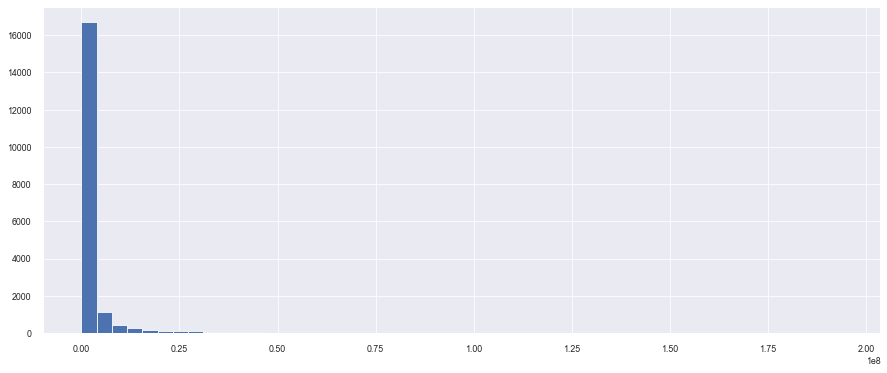

In [29]:
plt.figure(figsize=(15, 6))
plt.hist(df['value_eur'], bins=50);

Vemos que su comportamiento es exponencial. Para poder trabajar con estos datos vamos a tener que combertirla en lineal a travez de un transformacion logaritmica

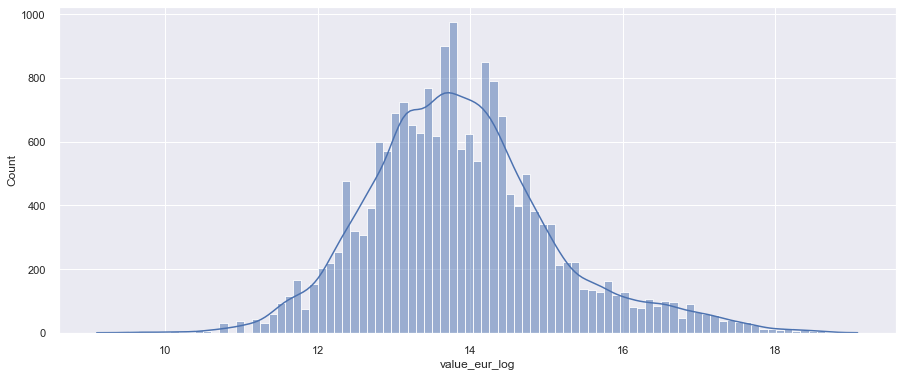

In [30]:
df['value_eur_log'] = np.log(df['value_eur'])

sns.set(rc={'figure.figsize':(15, 6)})
sns.histplot(df['value_eur_log'], kde=True);

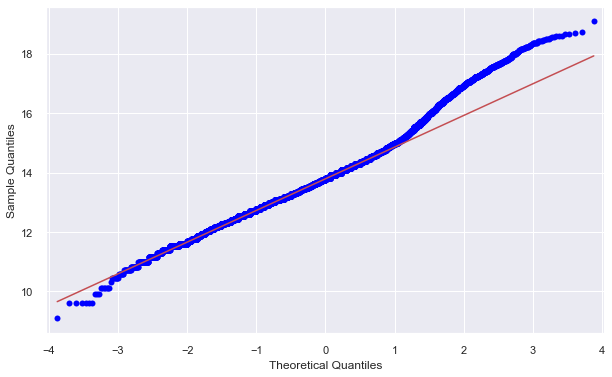

In [31]:
sns.set(rc={'figure.figsize':(10, 6)})
sm.qqplot(df['value_eur_log'], line='q')
pylab.show()

Como podemos ver, nuestra variable del precio de los jugadores al aplicarle una transformacion logaritmica cambio a una distribucion normal como ya se habia pensado. Por otro lado se realizo un Q-Q plot para confirmar de forma visual que nuestra nueva distribucion fuera normal y como vemos, la mayor parte del tiempo nuestros puntos siguen la linea recta, esto nos dice que nuestra distribucion no es perfectamente normal, pero la podemos interpretar como tal. Tenemos una distribucion normal de colas delgadas.

Podemos realizar analisis estadisticos como ANOVA, t-test o z-test

Por otro lado, tambien convertiremos a exponencial las variables de release_clause_eur y wage_eur ya que tambien tienen una distribucion exponencial y necesitamos que esten en euros para poder compararlas con el precio del juegador, y esto solo vamos a lograr si se encuentran en el mismo espacio tranformado

In [32]:
df['wage_eur_log'] = np.log(df['wage_eur'])

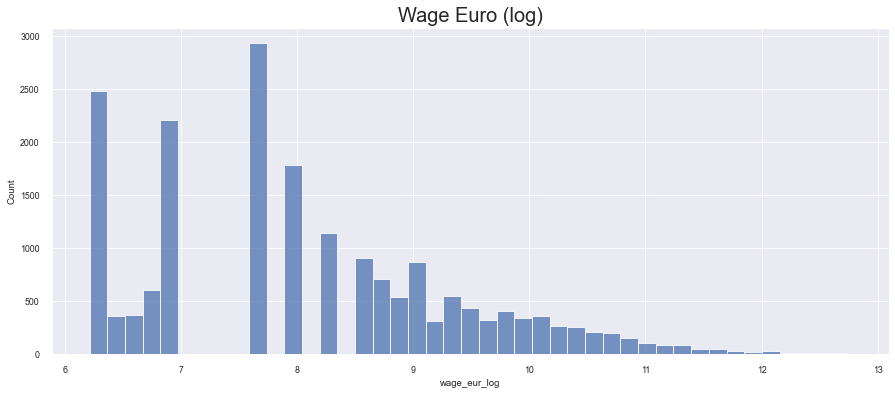

In [33]:
sns.set(context='paper', style='darkgrid', rc={'figure.figsize': (15, 6)})
ax = sns.histplot(df['wage_eur_log'])
ax.set_title('Wage Euro (log)', fontsize=20);

Tenemos muchos jugadores que tienen clausula de compra igual a 0 en los datos. No podemos eliminarlos, pero vamos a ver la correlacion entre ambas variables, ya que si estan fuertemente correlacionadas esto causaria una liminatacion en nuestro modelo de regresion lineal, ya se este modelo se ve perjudicado por la incorporacion de predictores correlacionados. Obtenemos una correlacion del 79%, por lo que estan fuertemente relacionadas lo que puede perjudicar nuestro modelo de regresion lineal.

In [34]:
df[['wage_eur', 'release_clause_eur']].corr()

,wage_eur,release_clause_eur
wage_eur,1.000000,0.794262
release_clause_eur,0.794262,1.000000


Vamos a observar ciertas distribuciones respecto a nuestros precios de jugadores. Es logico pensar que mientras mas famoso sea el equipo en el que juega mayor sera el precio y el salario del jugador.

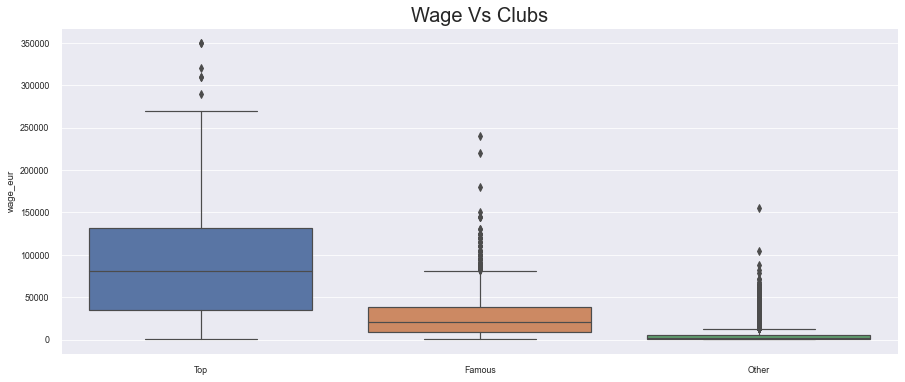

In [35]:
ax = sns.boxplot(y=df['wage_eur'], x=club_lvl)
ax.set_title('Wage Vs Clubs', fontsize=20);

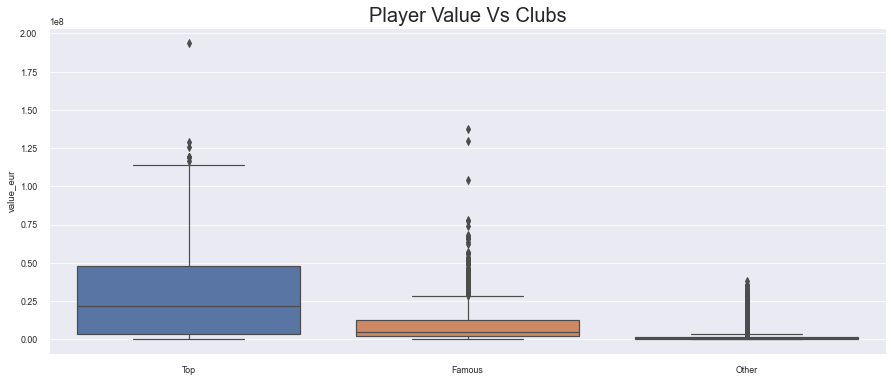

In [36]:
ax = sns.boxplot(y=df['value_eur'], x=club_lvl)
ax.set_title('Player Value Vs Clubs', fontsize=20);

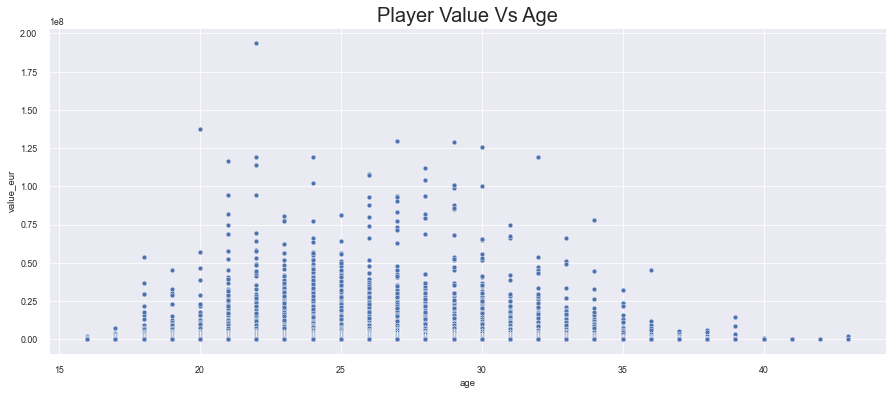

In [37]:
ax = sns.scatterplot(y=df['value_eur'], x=df['age'])
ax.set_title('Player Value Vs Age', fontsize=20);

Vamos a ubicar en un mapa donde se ubican nuestros jugadores. Dicho mapa se hizon con Tableau

In [38]:
# Filtramos por nacionalidad
country = df.groupby('nationality', as_index=False).count()[['nationality', 'short_name']]

# Vamos a utilizar geocoder para obtener informacion de ciudades
#coordenadas
coordenadas = []
for i in country['nationality']:
    coord = geocoder.osm(i)
    coordenadas.append(coord)

country_int = []
for i in range(len(country)):
    if isinstance(coordenadas[i].lat, float): 
        country_int.append([coordenadas[i].lat, coordenadas[i].lng, 
                            float(country['short_name'][i]), country['nationality'][i]])

# creamos el mapa
mapa = folium.Map(location=[0, 0], zoom_start=2)

# Añadimos circulos del tamaño de los jugadores disponibles en nuestra data de cada pais
for i in range(len(country_int)):
    folium.Circle(
      location=[country_int[i][0], country_int[i][1]],
      popup=country_int[i][3],
      radius=float(country_int[i][2])*200,
      color='crimson',
      fill=True,
      fill_color='crimson'
   ).add_to(mapa)

mapa

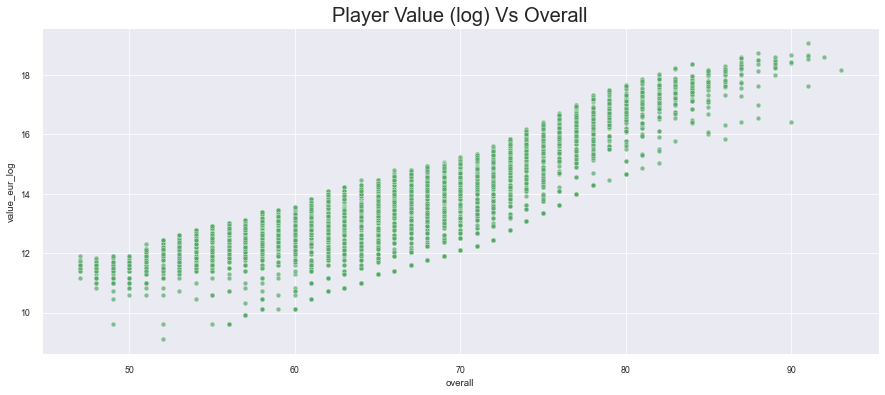

In [40]:
ax = sns.scatterplot(x=df['overall'], y=df['value_eur_log'], color='g', alpha=0.7)
ax.set_title('Player Value (log) Vs Overall', fontsize=20);

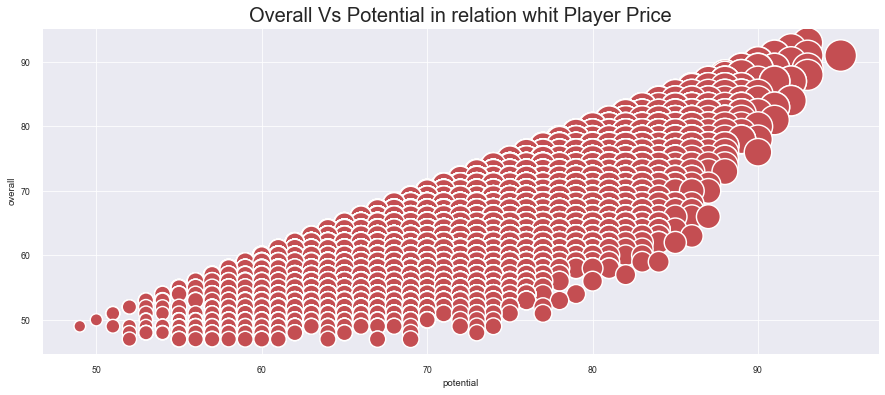

In [41]:
ax = sns.scatterplot(data=df, x='potential', y='overall', size='value_eur_log', legend=False, sizes=(0.01, 1000), color='r')
ax.set_title('Overall Vs Potential in relation whit Player Price', fontsize=20);

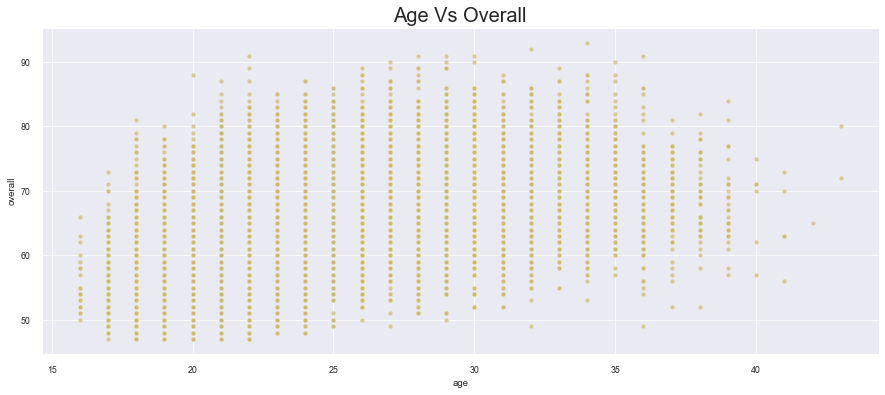

In [42]:
ax = sns.scatterplot(x=df['age'], y=df['overall'], color='y', alpha=0.7)
ax.set_title('Age Vs Overall', fontsize=20);

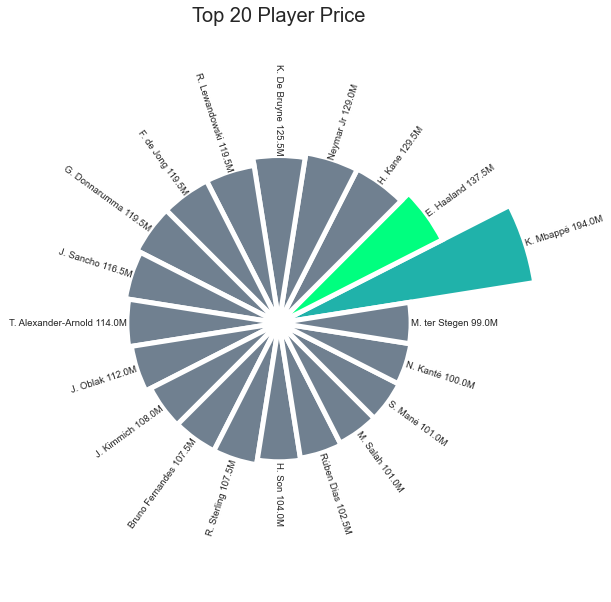

In [43]:
filt = df.sort_values('value_eur', ascending=False).iloc[0:20, :]

# set figure size
plt.figure(figsize=(20,10))

# plot polar axis
ax = plt.subplot(111, polar=True)

# remove grid
plt.axis('off')

# Set the coordinates limits
upperLimit = 100
lowerLimit = 30

# Compute max and min in the dataset
max_value = filt['value_eur'].max()

# Let's compute heights: they are a conversion of each item value in those new coordinates
# In our example, 0 in the dataset will be converted to the lowerLimit (10)
# The maximum will be converted to the upperLimit (100)
slope = (max_value - lowerLimit) / max_value
heights = slope * filt['value_eur'] + lowerLimit

# Compute the width of each bar. In total we have 2*Pi = 360°
width = 2*np.pi / len(filt.index)

# Compute the angle each bar is centered on:
angles = [element * width for element in range(1, len(filt.index)+1)]

# color = ['crimson', 'palevioletred', 'hotpink', 'deeppink', 'mediumvioletred',
#         'magenta', 'fuchsia', 'darkmagenta', 'purple', 'violet',
#         'mediumorchid', 'darkviolet', 'darkorchid', 'indigo', 'blueviolet',
#         'rebeccapurple', 'slateblue', 'blue', 'darkblue', 'navy']

color = ['lightseagreen', 'springgreen', 'slategray', 'slategray',
        'slategray', 'slategray', 'slategray', 'slategray', 'slategray',
        'slategray', 'slategray', 'slategray', 'slategray', 'slategray',
        'slategray', 'slategray', 'slategray', 'slategray', 'slategray', 'slategray']

# Draw bars
bars = ax.bar(x=angles, height=heights, width=width, bottom=lowerLimit, linewidth=5, edgecolor="white", color=color)


# little space between the bar and the label
labelPadding = 5

# Add labels
for bar, angle, height, label in zip(bars, angles, heights, 
                                     filt['short_name']+' '+[str(i/1_000_000).strip() + 'M' for i in filt['value_eur']]):

    # Labels are rotated. Rotation must be specified in degrees :(
    rotation = np.rad2deg(angle)

    # Flip some labels upside down
    alignment = ""
    if angle >= np.pi/2 and angle < 3*np.pi/2:
        alignment = "right"
        rotation = rotation + 180
    else: 
        alignment = "left"

    # Finally add the labels
    ax.text(
        x=angle, 
        y=lowerLimit + bar.get_height() + labelPadding, 
        s=label, 
        ha=alignment, 
        va='center', 
        rotation=rotation, 
        rotation_mode="anchor")
    
ax.set_title('Top 20 Player Price', fontsize=20);
ax.grid(color='w', linewidth=0.5, alpha=0)
plt.savefig(r'pictures/value_player.png', transparent=True);

Vamos a obtener una linea de tiempo con los cambios en el Precio para Mbappe, Haaland, Messi, Cristiano y Chiesa

In [44]:
year = ['15', '16', '17', '18', '19', '20', '21', '22']
names = ['Mbappé', 'Erling Braut', 'Chiesa', 'Lionel Andrés Messi', 'Cristiano Ronaldo']

player_price = pd.DataFrame(columns=names, index=year)
for i in year:
    read_df = pd.read_csv(r'archive/players_'+i+'.csv', low_memory=False)
    
    for n in names:
        value = read_df[read_df['long_name'].str.contains(n)]['value_eur'].values
        if len(value) > 0:
             player_price.loc[i, n] = int(value)/1_000_000
        else:
             player_price.loc[i, n] = 0
            
    
del read_df

player_price.head(10)

,Mbappé,Erling Braut,Chiesa,Lionel Andrés Messi,Cristiano Ronaldo
15,0,0,0,100.5,79.0
16,0,0,0,111.0,85.5
17,3.1,0,0.25,89.0,87.0
18,41.5,0.25,11.5,105.0,95.5
19,72.0,1.5,14.0,110.5,77.0
20,93.5,6.5,18.5,95.5,58.5
21,185.5,92.0,23.0,103.5,63.0
22,194.0,137.5,80.5,78.0,45.0


In [45]:
import plotly.express as px
plt.figure(figsize=(15, 8))

color = ['r', 'g', 'b', 'm', 'y']
for i in range(len(player_price.columns)): 
    fig = px.line(player_price, x=player_price.index, y=player_price.columns, markers=True, 
                 labels={'value': 'Valor Euro (Millones)', 'index': 'Temporada', 'variable': 'Jugador'})
    

fig.show();

<Figure size 1080x576 with 0 Axes>

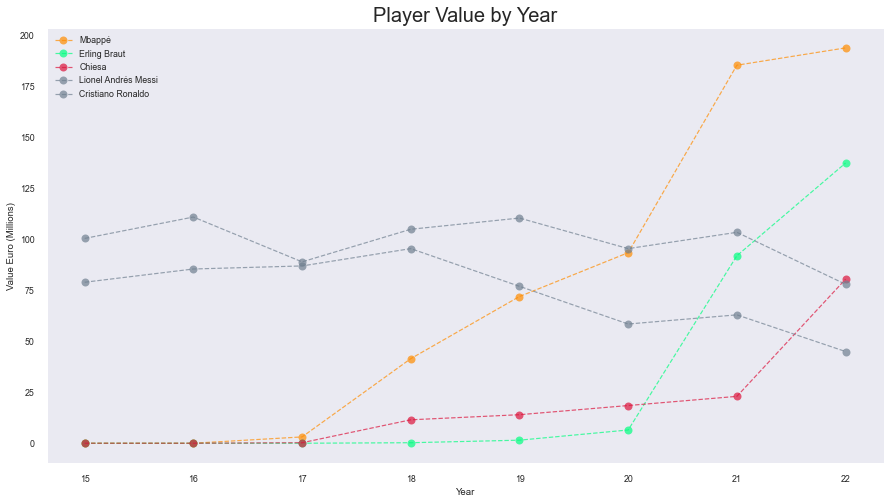

In [46]:
plt.figure(figsize=(15, 8))
sns.set_style("darkgrid")

color = ['darkorange', 'springgreen', 'crimson', 'slategray', 'slategray']
for i in range(len(player_price.columns)):   
    plt.plot(year, player_price.iloc[:, i], marker='o', markersize=8, color=color[i], alpha=0.7, linestyle='--', label=player_price.columns[i])

plt.xlabel('Year')
plt.ylabel('Value Euro (Millions)')
plt.title('Player Value by Year', fontsize=20)
legend = plt.legend(loc="upper left")
legend.get_frame().set_alpha(0)

plt.grid(color='w', linewidth=0.5, alpha=0)
plt.savefig(r'pictures/value_time.png', transparent=True)
plt.show();

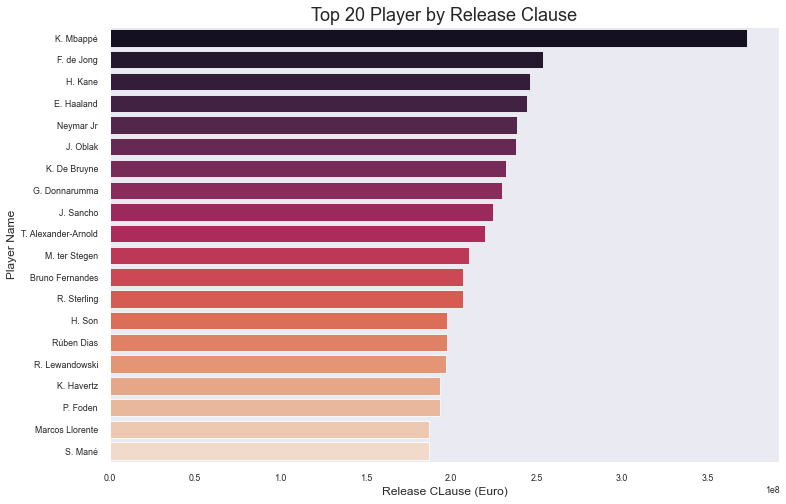

In [47]:
# Plot Style
sns.set(context='paper', style='darkgrid', rc={'figure.figsize': (12, 8)})

# Plot Configuration
ax = sns.barplot(data=df.sort_values('release_clause_eur', ascending=False).iloc[0:20, :], 
                 y='short_name', x='release_clause_eur', orient='h', palette='rocket')

ax.set_ylabel('Player Name', fontsize=12)
ax.set_xlabel('Release CLause (Euro)', fontsize=12)
ax.set_title('Top 20 Player by Release Clause', fontsize=18);

ax.grid(color='w', linewidth=0.5, alpha=0) 

Vamos a crear dos lista, una para los porteros y otra para el resto de jugadores. Esto lo hago debido a que tenemos los porteros se rigen por caracteristicas diferentes al resto de jugadores.

In [48]:
gk = df[df['pace'] == 0] 
player = df[df['pace'] != 0]

A partir de este momento se realizara el estudio para los jugadores que no son porteros. Vamos a ver la correlacion entre algunas de nuestras variables

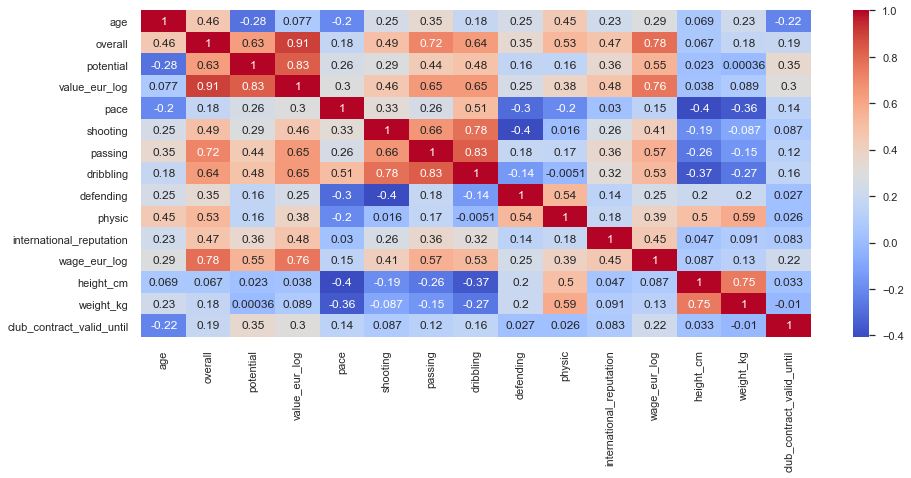

In [49]:
corr_player = player[['age', 'overall', 'potential', 'value_eur_log', 'pace', 
                      'shooting', 'passing', 'dribbling', 'defending', 'physic', 
                      'international_reputation', 'wage_eur_log', 'height_cm', 
                      'weight_kg', 'club_contract_valid_until']].corr()

sns.set(rc={'figure.figsize':(15, 6)})
sns.heatmap(corr_player, annot=True, cmap='coolwarm');

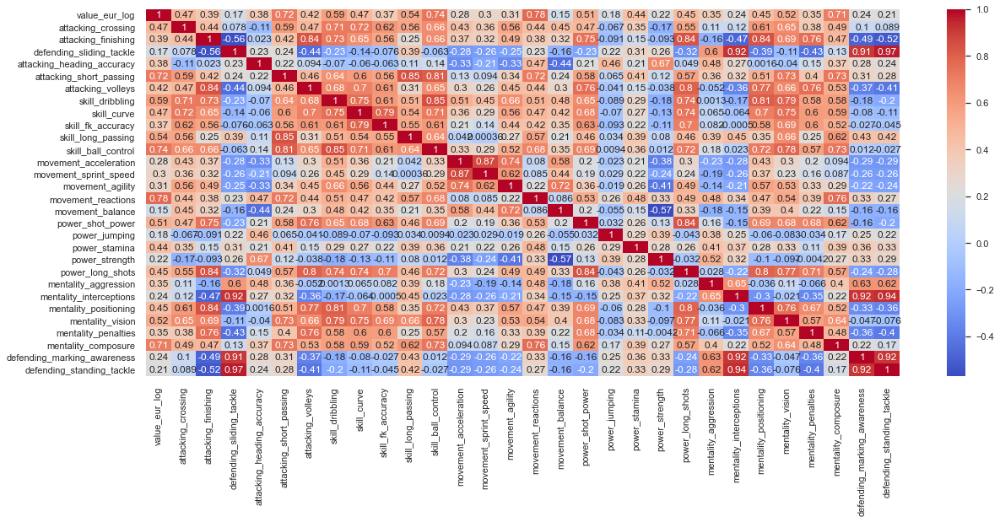

In [50]:
corr_player = player[['value_eur_log', 'attacking_crossing', 'attacking_finishing', 'defending_sliding_tackle',
                      'attacking_heading_accuracy', 'attacking_short_passing', 'attacking_volleys', 'skill_dribbling',
                      'skill_curve', 'skill_fk_accuracy', 'skill_long_passing', 'skill_ball_control', 'movement_acceleration',
                      'movement_sprint_speed', 'movement_agility', 'movement_reactions', 'movement_balance',
                      'power_shot_power', 'power_jumping', 'power_stamina', 'power_strength', 'power_long_shots',
                      'mentality_aggression', 'mentality_interceptions', 'mentality_positioning', 'mentality_vision',
                      'mentality_penalties', 'mentality_composure', 'defending_marking_awareness', 
                      'defending_standing_tackle']].corr()


sns.set(rc={'figure.figsize':(20, 8)})
sns.heatmap(corr_player, annot=True, cmap='coolwarm');

Podemos observar que varias columnas tienen cierto grado de correlacion con nuestra variable a predecir. Pero tenemos mas de 200 columnas y la mayoria no tiene mucha relacion con nuestra variable, por lo que vamos a tomar solo aquellas columnas que tengan un grado de correlacion mayor o menor a 0.25

In [51]:
player_corr = player._get_numeric_data().corr()

player_small = player[player_corr[(player_corr['value_eur_log'] >= 0.25) | (player_corr['value_eur_log'] <= -0.25)].index.tolist()]

In [52]:
player_small.drop(['value_eur', 'wage_eur', 'release_clause_eur'], axis=1, inplace=True)
player_small.shape

C:\Users\sasim\anaconda3\lib\site-packages\pandas\core\frame.py:4308: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



(17041, 36)

In [53]:
player_small.columns

Index(['overall', 'potential', 'club_contract_valid_until',
       'international_reputation', 'pace', 'shooting', 'passing', 'dribbling',
       'physic', 'attacking_crossing', 'attacking_finishing',
       'attacking_heading_accuracy', 'attacking_short_passing',
       'attacking_volleys', 'skill_dribbling', 'skill_curve',
       'skill_fk_accuracy', 'skill_long_passing', 'skill_ball_control',
       'movement_acceleration', 'movement_sprint_speed', 'movement_agility',
       'movement_reactions', 'power_shot_power', 'power_stamina',
       'power_long_shots', 'mentality_aggression', 'mentality_positioning',
       'mentality_vision', 'mentality_penalties', 'mentality_composure',
       'Club_Famous', 'Club_Other', 'Club_Top', 'value_eur_log',
       'wage_eur_log'],
      dtype='object')

Vamos a observar algunas de las distribuciones de nuestras variables.

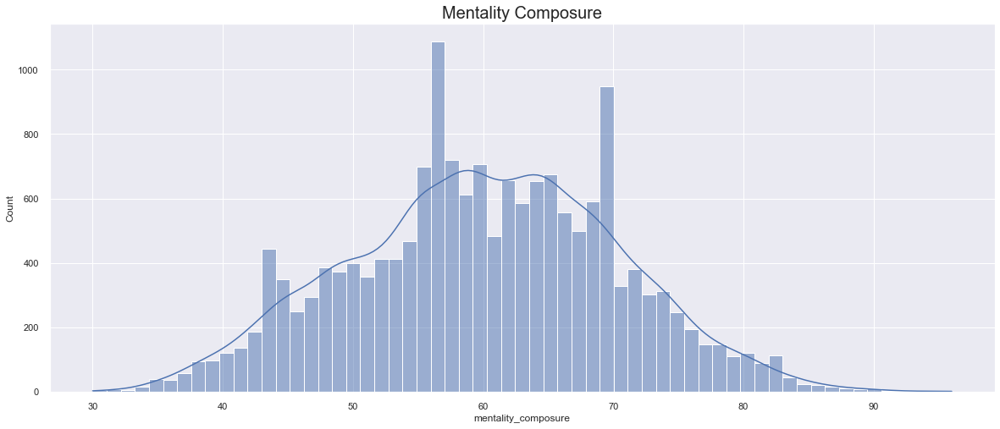

In [54]:
ax = sns.histplot(player['mentality_composure'], kde=True)
ax.set_title('Mentality Composure', fontsize=20);

Pairplot de varias variables del DataFrame players

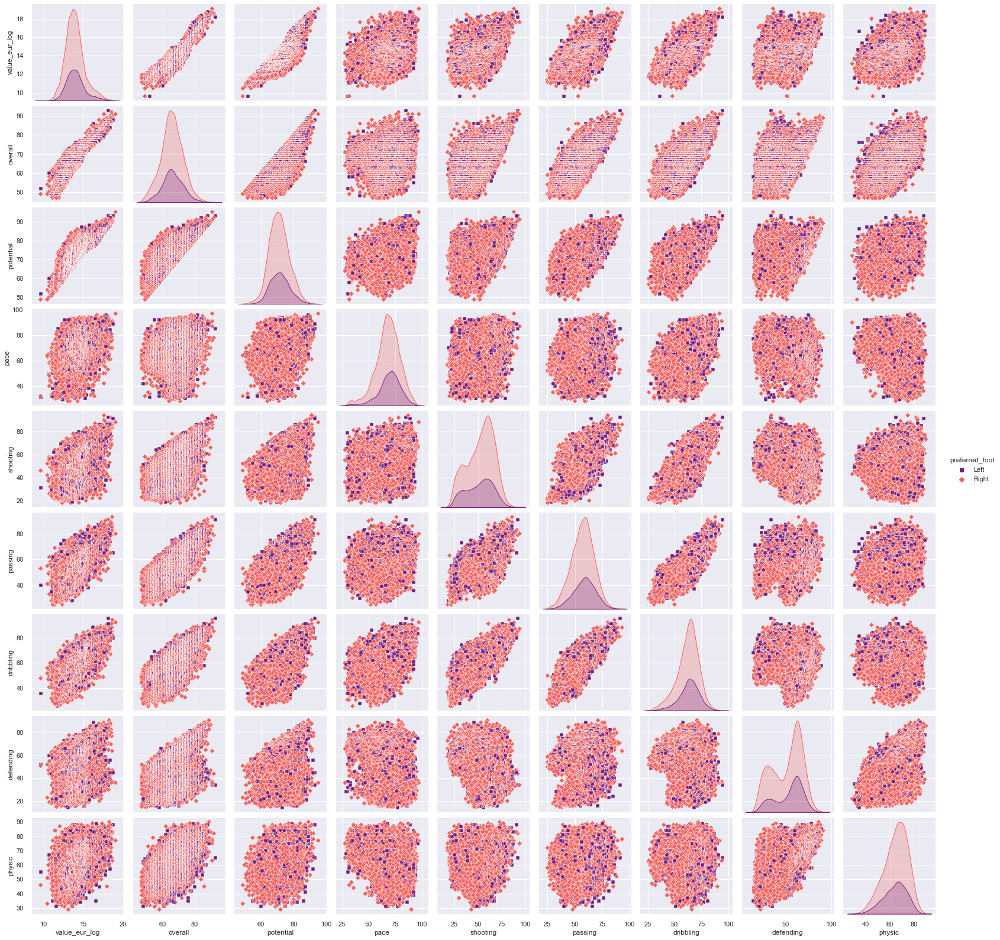

In [55]:
sns.pairplot(player[['value_eur_log', 'overall', 'potential', 'pace', 'preferred_foot', 
                 'shooting', 'passing', 'dribbling', 'defending', 'physic']], 
             hue='preferred_foot', markers=['s', 'D'], palette='magma');

## Estudio Estadistico

Ya tenemos nuestras variables para realizar nuestra regresion lineal, pero dichas variables hay que realizarles un test estadistico (si su distribucion es normal) para asegurar con contundencia, que las medias de las variables a estudiar son diferentes.

- H0 = Las medias son iguales
- H1 = Las medias no son iguales (en ANOVA, por lo menos un grupo tiene media diferente)
- Intervalo de confianza del 95%

Vamos a realizar el estudio para todos los jugadores excluyendo a los Porteros

In [56]:
# Vamos a ver las relaciones entre elelele
formula = 'value_eur_log  ~ C(club_rating)'

modelo = ols(formula=formula, data=player).fit() # Insertame los datos que te pase en la formula de minimos cuadrados. Has el calculo (fit())
anova_table = sm.stats.anova_lm(modelo, typ=1) # Tipo 1 porq es de una via
anova_table

,df,sum_sq,mean_sq,F,PR(>F)
C(club_rating),2.0,6634.717779,3317.358889,3169.815051,0.0
Residual,17038.0,17831.059494,1.046547,NaN,NaN


Vamos que nuestra hipotesis nula es falsa, por lo tanto, tenemos que las medias de los precios de los jugadores no son iguales en por lo menos uno de los grupos estudiados. Vamos a ver cuales

In [57]:
ttest_ind(player[player['club_rating'] == 'Top']['value_eur_log'], player[player['club_rating'] == 'Famous']['value_eur_log'])

Ttest_indResult(statistic=13.743914722541565, pvalue=2.585002444048467e-41)

In [58]:
ttest_ind(player[player['club_rating'] == 'Top']['value_eur_log'], player[player['club_rating'] == 'Other']['value_eur_log'])

Ttest_indResult(statistic=46.92761063937929, pvalue=0.0)

In [59]:
ttest_ind(player[player['club_rating'] == 'Other']['value_eur_log'], player[player['club_rating'] == 'Famous']['value_eur_log'])

Ttest_indResult(statistic=-68.1956551898698, pvalue=0.0)

Vemos que en todos los casos nuestra hipotesis nula es FALSA, por lo que las medias entre nuestros grupos no son iguales. Tenemos medias diferentes, por lo que la media del precio de los jugadores para cada grupo son diferentes.

Vamos a ver el analisis de ANOVA para las nacionalidades

In [60]:
formula = 'value_eur_log  ~ C(nationality)'

modelo = ols(formula=formula, data=player).fit() # Insertame los datos que te pase en la formula de minimos cuadrados. Has el calculo (fit())
anova_table = sm.stats.anova_lm(modelo, typ=1) # Tipo 1 porq es de una via
anova_table

,df,sum_sq,mean_sq,F,PR(>F)
C(nationality),161.0,5517.354474,34.269282,30.526616,0.0
Residual,16879.0,18948.422798,1.122603,NaN,NaN


Como vemos nuestra hipotesis nula tampoco se cumple ya que nuestro p-value es menor a 0.05, por lo que por lo menos en un grupo las medias de los precios de los jugadores son diferentes. Vamos a realizar un ANOVA para la posicion donde juegan

In [61]:
formula = 'value_eur_log  ~ C(club_position)'

modelo = ols(formula=formula, data=player).fit() # Insertame los datos que te pase en la formula de minimos cuadrados. Has el calculo (fit())
anova_table = sm.stats.anova_lm(modelo, typ=1) # Tipo 1 porq es de una via
anova_table

,df,sum_sq,mean_sq,F,PR(>F)
C(club_position),27.0,2449.230660,90.712247,70.096709,0.0
Residual,17013.0,22016.546612,1.294101,NaN,NaN


Tenemos un p-value menor a 0.05, por lo que en por lo menos uno de nuestros grupos tenemos medias diferentes. Vamos a ver si la media de los precios es la misma para el potencial y el rendimiento general del jugador.

In [62]:
# Overall

ttest_rel(player['overall'], player['value_eur_log'])

Ttest_relResult(statistic=1188.101000448144, pvalue=0.0)

In [63]:
# Potential

ttest_rel(player['potential'], player['value_eur_log'])

Ttest_relResult(statistic=1467.5879987034207, pvalue=0.0)

Obtenemos p-values menores a 0.05, por lo que nuestra hipotesis nula es falsas y la media entre nuestras variables son diferentes. Ahora veamos con respecto al salario del jugador. Otra vez nuestra hipotesis nula queda rechazada

Para no repetir el proceso realizado anteriormente para cada una de las variables presentes en el DataFrame player_small (que es el que contiene las variables que se van a utilizar en la regresion lineal), vamos a realizar un loop for en donde se realizara un t-test entre el precio del jugador en logaritmo y cada una de las demas variables en player_small. Los datos se guardaran en un DataFrame.

In [64]:
column_name = player_small._get_numeric_data().drop('value_eur_log', axis=1).columns

statistics_values = dict()
for i in column_name:
    f_stat, p_value = ttest_rel(player_small[i], player_small['value_eur_log'])
    statistics_values.update({i: p_value})

player_small_p_values = pd.DataFrame.from_dict(statistics_values, orient='index', columns=['P-value'])
player_small_p_values

,P-value
overall,0.0
potential,0.0
club_contract_valid_until,0.0
international_reputation,0.0
pace,0.0
shooting,0.0
passing,0.0
dribbling,0.0
physic,0.0
attacking_crossing,0.0


Al observar la tabla nos damos cuenta que para **NINGUN** caso nuestra hipotesis nula se cumple, por lo que las medias entre nuestras variables y el precio del jugador en euros seran diferentes. Podemos concluir que existe estadisticamente, una diferencia significativa entre los grupos estudiados, ya que provienen de distribuciones diferentes.

# Modelo de Regresion Lineal

### Precio para los jugadores

Creamos nuestras variables x, y para la regresion lineal

In [65]:
x = sm.add_constant(player_small.drop(['value_eur_log'], axis=1))
y = player['value_eur_log']

Con la funcion train_test_split podemos crear nuestras muestras de entrenamiento y testeo. El 30% de nuestra poblacion sera de testeo y con el random state vamos a poder lograr que tome datos de forma aleatoria para cada muestra. Se fijo en 42 para evitar que cada vez que se corriera el codigo se obtuvieran valores diferentes para la regresion lineal

In [66]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

Para poder usar las regresiones de Ridge y Lasso tenemos que estandarizar nuestras variables predictores, por lo que se uso StandardScalaer. Las muestras de Testeo y Entrenamiento de las variables predictores se estandarizaron para su posterior uso. 

In [67]:
# Iniciamos el modelo para estandarizar
ss = StandardScaler()

# Realizamos el fit para ambas muestras
z_train = ss.fit_transform(x_train)
z_test = ss.fit_transform(x_test)

# Transformamos z_train y z_test en Dataframes para poder usalor luego
z_train = pd.DataFrame(z_train, columns=x_train.columns)
z_test = pd.DataFrame(z_test, columns=x_test.columns)

##### Ridge

In [68]:
# Creamos una lista con los valores de alpha
r_alphas = np.logspace(0, 5, 100)

# Iniciamos la funcion RidgeCV que se va a encargar de hacer la regrecion lineal y de escoger el mejor alpha 
# de nuestra lista
ridge_model = RidgeCV(alphas=r_alphas, scoring='r2')

# Entrenamos el modelo con nuestra poblacion de entrenamiento
ridge_model = ridge_model.fit(z_train, y_train)

El mejor alpha encontrado es de

In [69]:
ridge_model.alpha_

8.11130830789687

Obtenemos el R2 y vemos que resulto del 94%, lo que nos dice que nuestro modelo es capaz de predecir correctamente el precio de los jugadores

In [70]:
ridge_model.best_score_

0.9463073223575517

Por ultimo obtenemos el RMSE para verificar el modelo con la poblacion de prueba y se obtuvo un valor cercano a 0, lo que nos dice que lo esta prediciendo correctamente 

In [71]:
rmse(y_test, ridge_model.predict(z_test))

0.0817311038682461

Por ultimo, vamos a ver si nuestro modelo de regresion es correcto, para ello debemos realizar un histograma del error entre nuestro valor predicho y nuestro valor verdadero, si la distribucion es normal entonces nuestra regresion lineal es correcta.

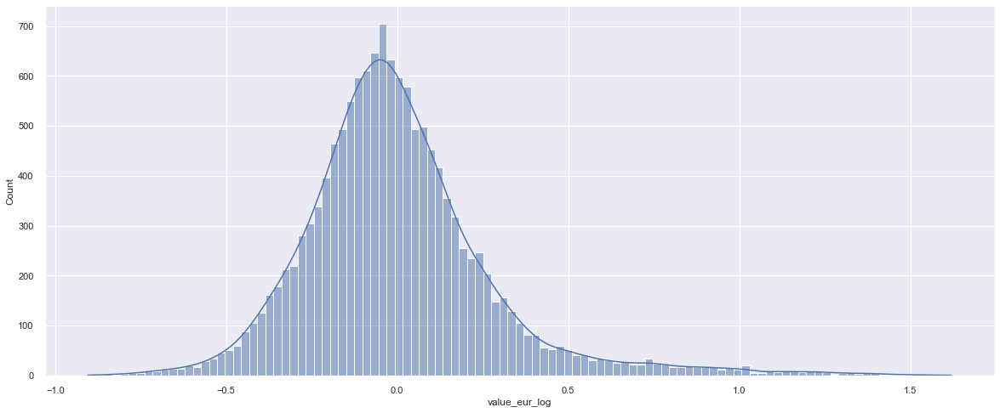

In [72]:
sns.histplot(ridge_model.predict(z_train) - y_train, kde=True);

##### Lasso

In [73]:
# eps = alpha_min/alpha_max = 1e-3
lasso_model = LassoCV(eps=1e-3, n_alphas=200)

# Nuestra funciona de Lasso va a encontrar el mejor valor de alpha y va a eliminar las variable que no aporten al modelo o
# las que tengan mucha correlacion con otras. Por otro lado, nos realiza nuestra regresion lineal.
lasso_model = lasso_model.fit(z_train, y_train)

In [74]:
# Valor de alpha seleccionado
lasso_model.alpha_

0.0010844949927320219

In [75]:
# Coeficientes de nuestras variables predictoras
lasso_model.coef_

array([ 0.        ,  0.70527329,  0.43616375,  0.03576258,  0.03463681,
        0.07618405,  0.        , -0.        ,  0.        , -0.        ,
       -0.04252048,  0.0348422 , -0.0102631 ,  0.03118012,  0.00187928,
        0.02606964, -0.01691466, -0.00253896, -0.00271788,  0.00868256,
        0.01997675,  0.00585929, -0.02986464,  0.01390153, -0.00799164,
        0.03576614, -0.        , -0.02909608, -0.        ,  0.0053808 ,
       -0.02987145, -0.03412613,  0.        , -0.03732928,  0.00719211,
        0.07047698])

Vemos que lasso nos redujo nuestros parametros predictores de 37 a 29 variables.

Calculamos el RMSE para los valores de prueba y entrenamiento. Tambien calculamos el R2 del ajuste

In [76]:
predic_train_lasso = lasso_model.predict(z_train)
predic_test_lasso = lasso_model.predict(z_test)

rmse(y_train, predic_train_lasso)

0.07646506820497702

In [77]:
rmse(y_test, predic_test_lasso)

0.08181669638956886

In [78]:
r2(y_train, predic_train_lasso)

0.9465034998691837

In [79]:
r2(y_test, predic_test_lasso)

0.9439994993508054

##### Vamos a generar el modelo de regresion con OLS lineal para asi observar los P-values. Usaremos solo las variables ponderadas por Lasso 

Ahora vamos a ver que variables no tienen impacto en nuestra regresion lineal y para ello analizaremos el p-value de nuestra regresion lineal.

In [80]:
name_var = []
for i, j in zip(lasso_model.coef_, x_train.columns):
    if i != 0:
        name_var.append(j)

In [81]:
modelo_no_lasso = sm.OLS(y_train, x_train.loc[:, ['const'] + list(name_var)]).fit()

In [82]:
modelo_no_lasso.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          value_eur_log   R-squared:                       0.947
Model:                            OLS   Adj. R-squared:                  0.946
Method:                 Least Squares   F-statistic:                     8606.
Date:                Fri, 08 Oct 2021   Prob (F-statistic):               0.00
Time:                        22:26:31   Log-Likelihood:                -1811.9
No. Observations:               13632   AIC:                             3682.
Df Residuals:                   13603   BIC:                             3900.
Df Model:                          28                                         
Covariance Type:            nonrobust                                         
==============================================================================================
                                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------
const                        -59.1240      4.242    -13.937      0.000     -67.440     -50.808
overall                        0.1051      0.001     88.917      0.000       0.103       0.107
potential                      0.0721      0.001    119.728      0.000       0.071       0.073
club_contract_valid_until      0.0297      0.002     14.139      0.000       0.026       0.034
international_reputation       0.0959      0.008     11.929      0.000       0.080       0.112
pace                       -1.087e-05      0.008     -0.001      0.999      -0.016       0.016
attacking_crossing            -0.0034      0.000    -11.063      0.000      -0.004      -0.003
attacking_finishing            0.0022      0.000      6.341      0.000       0.002       0.003
attacking_heading_accuracy    -0.0013      0.000     -3.825      0.000      -0.002      -0.001
attacking_short_passing        0.0041      0.001      5.948      0.000       0.003       0.005
attacking_volleys              0.0005      0.000      1.520      0.128      -0.000       0.001
skill_dribbling                0.0024      0.001      4.665      0.000       0.001       0.003
skill_curve                   -0.0013      0.000     -3.806      0.000      -0.002      -0.001
skill_fk_accuracy             -0.0001      0.000     -0.475      0.635      -0.001       0.000
skill_long_passing            -0.0008      0.000     -1.781      0.075      -0.002    7.68e-05
skill_ball_control             0.0009      0.001      1.219      0.223      -0.001       0.002
movement_acceleration          0.0050      0.004      1.367      0.172      -0.002       0.012
movement_sprint_speed          0.0044      0.005      0.981      0.327      -0.004       0.013
movement_agility              -0.0030      0.000     -8.471      0.000      -0.004      -0.002
movement_reactions             0.0017      0.001      2.782      0.005       0.000       0.003
power_shot_power              -0.0010      0.000     -2.871      0.004      -0.002      -0.000
power_stamina                  0.0033      0.000     12.058      0.000       0.003       0.004
mentality_aggression          -0.0021      0.000     -8.598      0.000      -0.003      -0.002
mentality_vision               0.0008      0.000      1.981      0.048    8.72e-06       0.002
mentality_penalties           -0.0028      0.000     -8.185      0.000      -0.003      -0.002
mentality_composure           -0.0039      0.000     -8.497      0.000      -0.005      -0.003
Club_Other                    -0.1110      0.009    -12.299      0.000      -0.129      -0.093
Club_Top                       0.0636      0.021      2.988      0.003       0.022       0.105
wage_eur_log                   0.0527      0.003     17.432      0.000       0.047       0.059
===========================================

Como vemos para cada una de nuestra variables independiente tenemos un p-value. Tenemos casos donde el p-value es mayor a 0.05 lo que quiere decir que nuestra hipotesis nula se cumple y se explica como que esas variables independiente no contribuyen de forma significativa al modelo, por lo que las eliminaremos y volveremos a entrenar el modelo

In [83]:
x_train_ols = x_train.loc[:, ['const'] + list(name_var)]
x_train_ols.drop(['pace', 'movement_acceleration', 'skill_ball_control', 'movement_sprint_speed', 
                 'attacking_volleys', 'skill_fk_accuracy', 'skill_long_passing'], axis=1, inplace=True)

In [84]:
modelo_ols = sm.OLS(y_train, x_train_ols).fit()
predic_train_ols = modelo_ols.predict(x_train_ols)

modelo_ols.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          value_eur_log   R-squared:                       0.944
Model:                            OLS   Adj. R-squared:                  0.944
Method:                 Least Squares   F-statistic:                 1.086e+04
Date:                Fri, 08 Oct 2021   Prob (F-statistic):               0.00
Time:                        22:26:33   Log-Likelihood:                -2170.7
No. Observations:               13632   AIC:                             4385.
Df Residuals:                   13610   BIC:                             4551.
Df Model:                          21                                         
Covariance Type:            nonrobust                                         
==============================================================================================
                                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------
const                        -64.3780      4.347    -14.810      0.000     -72.899     -55.858
overall                        0.1092      0.001     93.057      0.000       0.107       0.112
potential                      0.0747      0.001    122.963      0.000       0.074       0.076
club_contract_valid_until      0.0324      0.002     15.036      0.000       0.028       0.037
international_reputation       0.0884      0.008     10.758      0.000       0.072       0.104
attacking_crossing            -0.0027      0.000     -8.720      0.000      -0.003      -0.002
attacking_finishing            0.0032      0.000      9.641      0.000       0.003       0.004
attacking_heading_accuracy    -0.0015      0.000     -4.557      0.000      -0.002      -0.001
attacking_short_passing        0.0007      0.001      1.274      0.203      -0.000       0.002
skill_dribbling                0.0047      0.000     10.161      0.000       0.004       0.006
skill_curve                   -0.0017      0.000     -5.278      0.000      -0.002      -0.001
movement_agility               0.0020      0.000      6.720      0.000       0.001       0.003
movement_reactions             0.0006      0.001      0.974      0.330      -0.001       0.002
power_shot_power              -0.0008      0.000     -2.316      0.021      -0.001      -0.000
power_stamina                  0.0045      0.000     16.162      0.000       0.004       0.005
mentality_aggression          -0.0030      0.000    -11.697      0.000      -0.003      -0.002
mentality_vision              -0.0007      0.000     -1.659      0.097      -0.002       0.000
mentality_penalties           -0.0032      0.000     -9.579      0.000      -0.004      -0.003
mentality_composure           -0.0053      0.000    -11.352      0.000      -0.006      -0.004
Club_Other                    -0.1116      0.009    -12.061      0.000      -0.130      -0.093
Club_Top                       0.0753      0.022      3.453      0.001       0.033       0.118
wage_eur_log                   0.0519      0.003     16.769      0.000       0.046       0.058
==============================================================================
Omnibus:                     3892.200   Durbin-Watson:                   2.040
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            14848.790
Skew:                          -1.387   Prob(JB):                         0.00
Kurtosis:                       7.295   Cond. No.                     3.64e+06
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 3.64e+06. This might indicate that there are
strong multicollinearity or other numerical problems.


In [85]:
x_train_ols.drop(['attacking_short_passing', 'mentality_vision', 'movement_reactions'], axis=1, inplace=True)

modelo_ols = sm.OLS(y_train, x_train_ols).fit()
predic_train_ols = modelo_ols.predict(x_train_ols)

modelo_ols.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          value_eur_log   R-squared:                       0.944
Model:                            OLS   Adj. R-squared:                  0.944
Method:                 Least Squares   F-statistic:                 1.267e+04
Date:                Fri, 08 Oct 2021   Prob (F-statistic):               0.00
Time:                        22:26:33   Log-Likelihood:                -2172.7
No. Observations:               13632   AIC:                             4383.
Df Residuals:                   13613   BIC:                             4526.
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
==============================================================================================
                                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------
const                        -64.4890      4.345    -14.841      0.000     -73.007     -55.972
overall                        0.1102      0.001    111.133      0.000       0.108       0.112
potential                      0.0747      0.001    123.463      0.000       0.074       0.076
club_contract_valid_until      0.0324      0.002     15.065      0.000       0.028       0.037
international_reputation       0.0879      0.008     10.728      0.000       0.072       0.104
attacking_crossing            -0.0028      0.000     -8.910      0.000      -0.003      -0.002
attacking_finishing            0.0030      0.000      9.564      0.000       0.002       0.004
attacking_heading_accuracy    -0.0014      0.000     -4.451      0.000      -0.002      -0.001
skill_dribbling                0.0047      0.000     10.313      0.000       0.004       0.006
skill_curve                   -0.0017      0.000     -5.512      0.000      -0.002      -0.001
movement_agility               0.0020      0.000      6.679      0.000       0.001       0.003
power_shot_power              -0.0008      0.000     -2.420      0.016      -0.001      -0.000
power_stamina                  0.0044      0.000     16.194      0.000       0.004       0.005
mentality_aggression          -0.0029      0.000    -11.774      0.000      -0.003      -0.002
mentality_penalties           -0.0032      0.000     -9.611      0.000      -0.004      -0.003
mentality_composure           -0.0053      0.000    -11.857      0.000      -0.006      -0.004
Club_Other                    -0.1120      0.009    -12.113      0.000      -0.130      -0.094
Club_Top                       0.0753      0.022      3.453      0.001       0.033       0.118
wage_eur_log                   0.0518      0.003     16.762      0.000       0.046       0.058
==============================================================================
Omnibus:                     3899.969   Durbin-Watson:                   2.040
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            14902.319
Skew:                          -1.389   Prob(JB):                         0.00
Kurtosis:                       7.303   Cond. No.                     3.63e+06
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 3.63e+06. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Como vemos el p-value de todas nuestras variables predictivas es menor a 0.05, por lo que todas nuestras variables son significativas para el modelo. Por otro lado, El p-value del modelo es significativo (F-statistics) por lo que se puede aceptar al menos uno de los coeficientes parciales de regresión es distinto de 0.

Por ultimo el r2 se ajusto igual que el de lasso en 0.94, por lo que podemos explicar la variacion del 94% de nuestros datos

In [86]:
x_test_ols = x_test.loc[:, ['const'] + list(name_var)]
x_test_ols.drop(['pace', 'movement_acceleration', 'skill_ball_control', 'movement_sprint_speed', 
                 'attacking_volleys', 'skill_fk_accuracy', 'skill_long_passing', 
                 'attacking_short_passing', 'mentality_vision', 'movement_reactions'], axis=1, inplace=True)


predic_test_ols = modelo_ols.predict(x_test_ols)

In [87]:
rmse(y_test, predic_test_ols)

0.08788015266169019

In [88]:
r2(y_test, predic_test_ols)

0.9398492879405757

Ahora vamos a ver cual es el porcentaje de incremento de nuestra variable dependiente a partir de cambios en nuestras variables independientes

In [89]:
interpre = []
for i, j in zip(modelo_ols.params.values, modelo_ols.pvalues.index):
    if 'log' in j:
        # Esto se hace para nuestras variables independientes logaritmicas
        interpre.append((1.01**i - 1)*100)
    else:
        # Esto se hace para nuestras variables independientes que no estan transformadas
        interpre.append((np.exp(i) - 1) * 100)

player_percent = pd.DataFrame(interpre, index=modelo_ols.pvalues.index, columns=['% of Increase'])
var_value_player = player_percent[(player_percent['% of Increase'] > 0) | (player_percent['% of Increase'] < 0)].sort_values('% of Increase', ascending=False)
var_value_player

,% of Increase
overall,11.651968
international_reputation,9.188686
Club_Top,7.825359
potential,7.758319
club_contract_valid_until,3.295855
skill_dribbling,0.467408
power_stamina,0.444630
attacking_finishing,0.305353
movement_agility,0.200208
wage_eur_log,0.051534


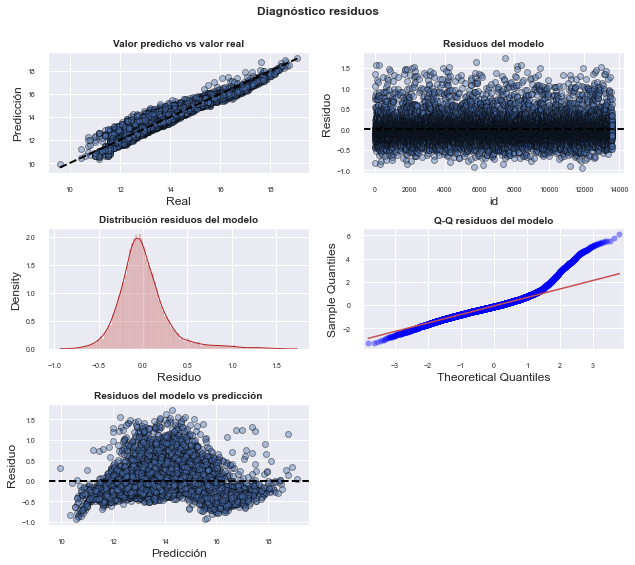

In [90]:
residuos_train = predic_train_ols - y_train

fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(9, 8))

axes[0, 0].scatter(y_train, predic_train_ols, edgecolors=(0, 0, 0), alpha = 0.4)
axes[0, 0].plot([y_train.min(), y_train.max()], [y_train.min(), y_train.max()],
                'k--', color = 'black', lw=2)
axes[0, 0].set_title('Valor predicho vs valor real', fontsize = 10, fontweight = "bold")
axes[0, 0].set_xlabel('Real')
axes[0, 0].set_ylabel('Predicción')
axes[0, 0].tick_params(labelsize = 7)

axes[0, 1].scatter(list(range(len(y_train))), residuos_train,
                   edgecolors=(0, 0, 0), alpha = 0.4)
axes[0, 1].axhline(y = 0, linestyle = '--', color = 'black', lw=2)
axes[0, 1].set_title('Residuos del modelo', fontsize = 10, fontweight = "bold")
axes[0, 1].set_xlabel('id')
axes[0, 1].set_ylabel('Residuo')
axes[0, 1].tick_params(labelsize = 7)

sns.histplot(
    data    = residuos_train,
    stat    = "density",
    kde     = True,
    line_kws= {'linewidth': 1},
    color   = "firebrick",
    alpha   = 0.3,
    ax      = axes[1, 0]
)

axes[1, 0].set_title('Distribución residuos del modelo', fontsize = 10,
                     fontweight = "bold")
axes[1, 0].set_xlabel("Residuo")
axes[1, 0].tick_params(labelsize = 7)


sm.qqplot(
    residuos_train,
    fit   = True,
    line  = 'q',
    ax    = axes[1, 1], 
    color = 'firebrick',
    alpha = 0.4,
    lw    = 2
)
axes[1, 1].set_title('Q-Q residuos del modelo', fontsize = 10, fontweight = "bold")
axes[1, 1].tick_params(labelsize = 7)

axes[2, 0].scatter(predic_train_ols, residuos_train,
                   edgecolors=(0, 0, 0), alpha = 0.4)
axes[2, 0].axhline(y = 0, linestyle = '--', color = 'black', lw=2)
axes[2, 0].set_title('Residuos del modelo vs predicción', fontsize = 10, fontweight = "bold")
axes[2, 0].set_xlabel('Predicción')
axes[2, 0].set_ylabel('Residuo')
axes[2, 0].tick_params(labelsize = 7)

# Se eliminan los axes vacíos
fig.delaxes(axes[2,1])

fig.tight_layout()
plt.subplots_adjust(top=0.9)
fig.suptitle('Diagnóstico residuos', fontsize = 12, fontweight = "bold");

Vemos el comportamiento de nuestros Residuos y nos damos cuenta que tienen un comportamiento casi normal y aleatorio. Tenemos una cola larga en nuestros histograma que esta provocando la desviacion respecto a la linea recta en nuestro Q-Q plot

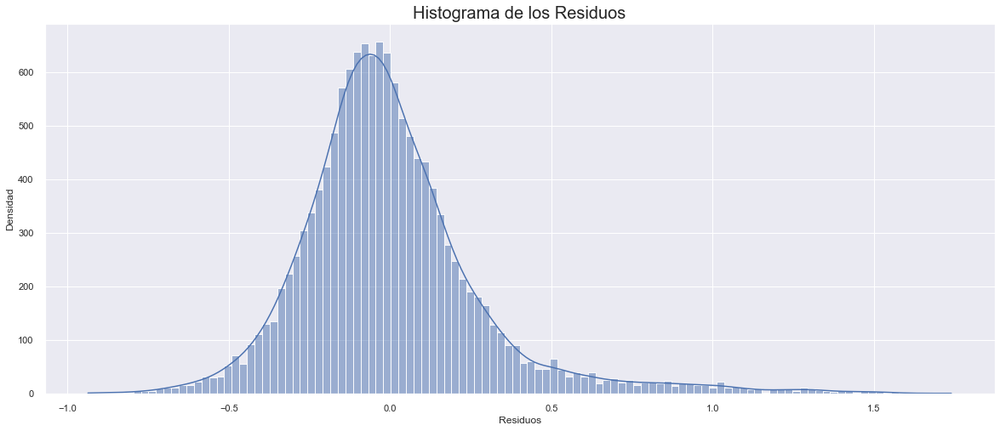

In [91]:
sns.histplot(residuos_train, kde=True)
plt.xlabel('Residuos')
plt.ylabel('Densidad')
plt.title('Histograma de los Residuos', fontsize=20)

ax.grid(color='w', linewidth=0.5, alpha=0)
plt.savefig(r'pictures/residuos.png', transparent=True);

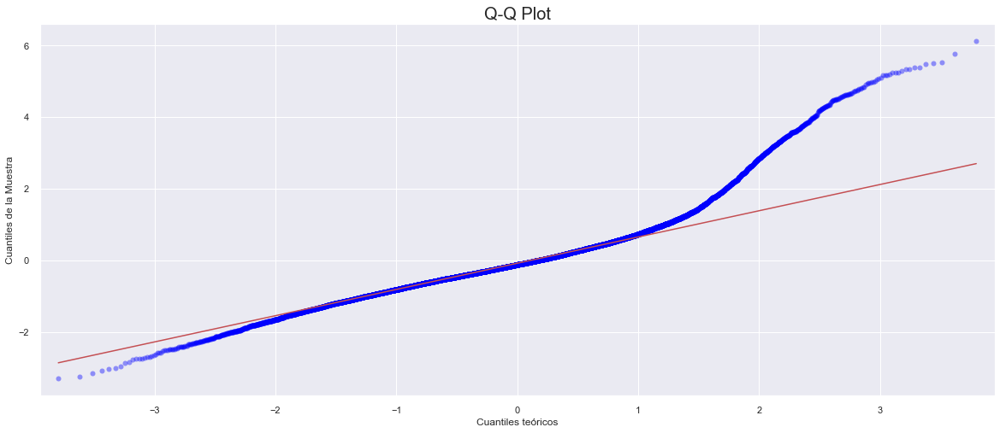

In [92]:
sm.qqplot(residuos_train, fit=True, line='q', color='firebrick', alpha=0.4)
plt.xlabel('Cuantiles teóricos')
plt.ylabel('Cuantiles de la Muestra')
plt.title('Q-Q Plot', fontsize=20)

ax.grid(color='w', linewidth=0.5, alpha=0)
plt.savefig(r'pictures/qqplot.png', transparent=True);

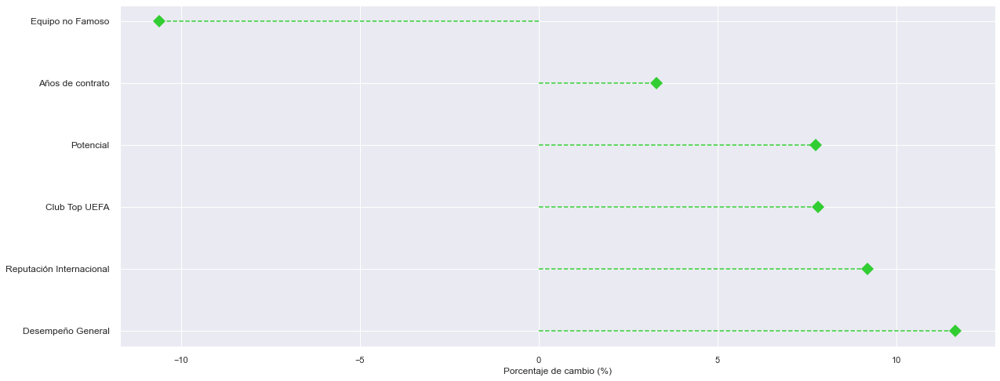

In [93]:
# Create a dataframe
perc = var_value_player[(var_value_player['% of Increase'] > 1) | (var_value_player['% of Increase'] < -1)][:-1] 
    
# Reorder it based on the values
ordered_df = perc
my_range=range(1,len(perc.index)+1)
 
# The horizontal plot is made using the hline function
plt.hlines(y=my_range, xmin=0, xmax=ordered_df['% of Increase'], color='Limegreen', linestyles='--',)
plt.plot(ordered_df['% of Increase'], my_range, "D", markersize=12, color='limegreen')
 
# Add titles and axis names

plt.yticks(my_range, ['Desempeño General', 'Reputación Internacional', 'Club Top UEFA',
                     'Potencial', 'Años de contrato', 'Equipo no Famoso'], fontsize=12)


# plt.title("A vertical lolipop plot", loc='left')
plt.xlabel('Porcentaje de cambio (%)', fontsize=12)

# Show the plot
plt.savefig(r'pictures/results.png', transparent=True)
plt.show();

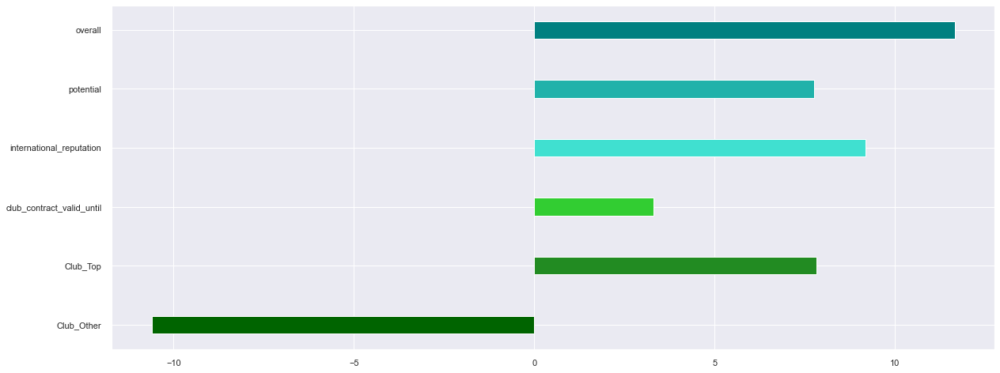

In [94]:
x = perc.loc[['Club_Other', 'Club_Top', 'club_contract_valid_until', 'international_reputation', 'potential', 'overall'], :]
plt.barh(y=x.index, width=x['% of Increase'], height=0.3, color=['darkgreen', 'forestgreen', 'limegreen', 'turquoise',
                                                                'lightseagreen', 'teal'])
plt.savefig(r'pictures/results2.png', transparent=True)

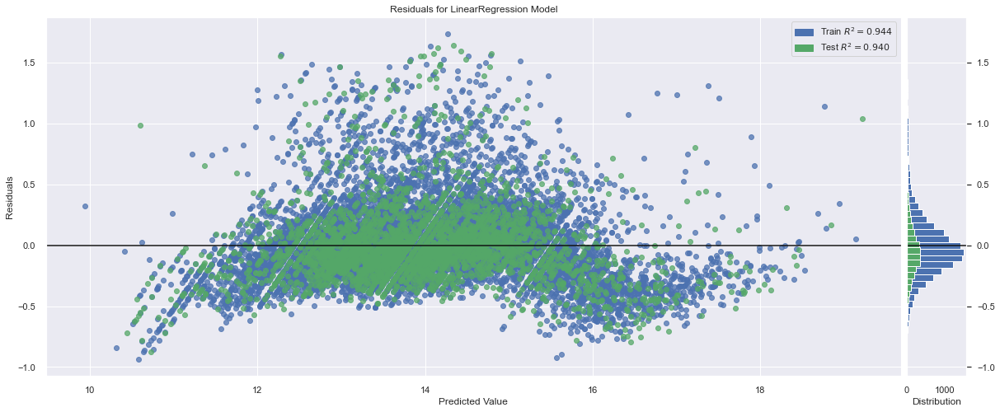

In [95]:
z_train_lr = z_train.loc[:, ['const'] + list(name_var)]
z_train_lr.drop(['pace', 'movement_acceleration', 'skill_ball_control', 'movement_sprint_speed', 
                 'attacking_volleys', 'skill_fk_accuracy', 'skill_long_passing', 
                 'attacking_short_passing', 'mentality_vision', 'movement_reactions'], axis=1, inplace=True)

z_test_lr = z_test.loc[:, ['const'] + list(name_var)]
z_test_lr.drop(['pace', 'movement_acceleration', 'skill_ball_control', 'movement_sprint_speed', 
                 'attacking_volleys', 'skill_fk_accuracy', 'skill_long_passing', 
                 'attacking_short_passing', 'mentality_vision', 'movement_reactions'], axis=1, inplace=True)

linreg = LinearRegression()
linreg.fit(z_train_lr, y_train)


visualizer = ResidualsPlot(linreg, hist=True)
visualizer.fit(z_train_lr, y_train)
visualizer.score(z_test_lr, y_test)
plt.savefig(r'pictures/residuals.png')
g = visualizer.poof();

## Precio de los porteros

Los porteros se rigen por parametros diferentes que el resto de jugadores, por lo que el calculo de su precio depende de otras variables. Vamos a realizar una regresion lineal para este grupo. En este caso solo se aplicara el modelo de Lasso

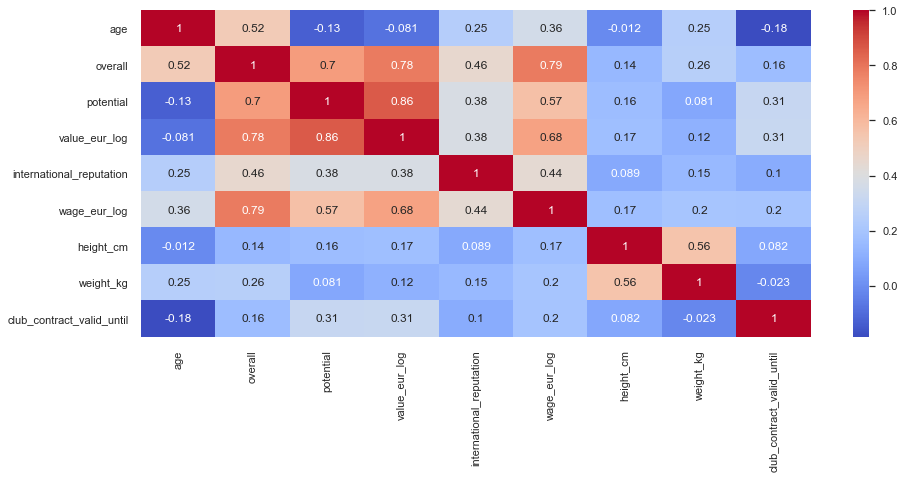

In [96]:
corr_gk = gk[['age', 'overall', 'potential', 'value_eur_log', 
              'international_reputation', 'wage_eur_log', 'height_cm', 
              'weight_kg', 'club_contract_valid_until']].corr()

sns.set(rc={'figure.figsize':(15, 6)})
sns.heatmap(corr_gk, annot=True, cmap='coolwarm');

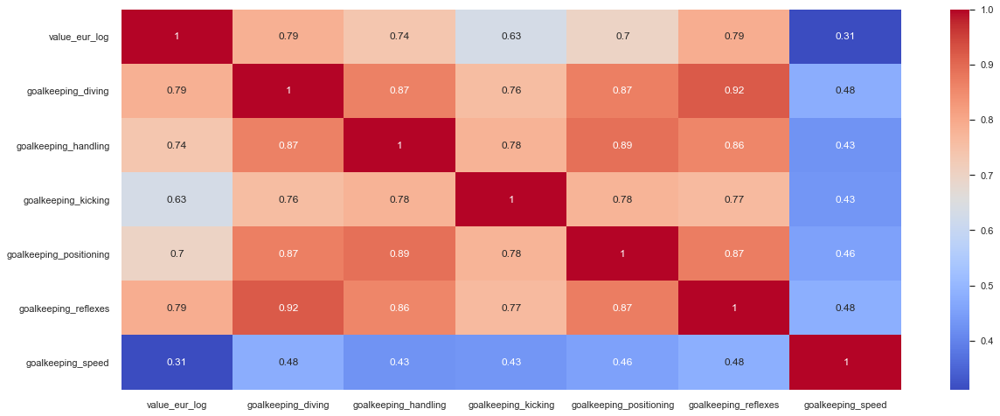

In [97]:
corr_gk = gk[['value_eur_log', 'goalkeeping_diving', 'goalkeeping_handling', 
              'goalkeeping_kicking', 'goalkeeping_positioning', 'goalkeeping_reflexes', 
              'goalkeeping_speed']].corr()


sns.set(rc={'figure.figsize':(20, 8)})
sns.heatmap(corr_gk, annot=True, cmap='coolwarm');

Vemos que existe una muy buena correlacion entre el valor de los porteros y su potencial y valoracion en general. Tambien existe una correlacion positiva con todas las caracteristicas que definen un arquero, es decir, reflejos, posicionamiento, entre otros.

In [98]:
gk_corr = gk._get_numeric_data().corr()

gk_small = gk[gk_corr[(gk_corr['value_eur_log'] >= 0.25) | (gk_corr['value_eur_log'] <= -0.25)].index.tolist()]

In [99]:
gk_small.drop(['value_eur', 'wage_eur', 'release_clause_eur'], axis=1, inplace=True)
gk_small.shape

C:\Users\sasim\anaconda3\lib\site-packages\pandas\core\frame.py:4308: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



(2124, 24)

In [100]:
gk_small.columns

Index(['overall', 'potential', 'club_contract_valid_until',
       'international_reputation', 'attacking_short_passing',
       'skill_dribbling', 'skill_ball_control', 'movement_acceleration',
       'movement_sprint_speed', 'movement_reactions', 'power_shot_power',
       'mentality_vision', 'mentality_composure', 'goalkeeping_diving',
       'goalkeeping_handling', 'goalkeeping_kicking',
       'goalkeeping_positioning', 'goalkeeping_reflexes', 'goalkeeping_speed',
       'Position_GK', 'Club_Famous', 'Club_Other', 'value_eur_log',
       'wage_eur_log'],
      dtype='object')

##### Vamos con el analisis estadistico

Al igual que para los jugadores, vamos a comenzar con un t-test donde vamos a relacionar las medias de los precios de los porteros con la media de las distintas variables.

In [101]:
column_name = gk_small._get_numeric_data().drop('value_eur_log', axis=1).columns

statistics_values = dict()
for i in column_name:
    f_stat, p_value = ttest_rel(gk_small[i], gk_small['value_eur_log'])
    statistics_values.update({i: p_value})

pd.DataFrame.from_dict(statistics_values, orient='index', columns=['P-value'])

,P-value
overall,0.000000
potential,0.000000
club_contract_valid_until,0.000000
international_reputation,0.000000
attacking_short_passing,0.000000
skill_dribbling,0.229117
skill_ball_control,0.000000
movement_acceleration,0.000000
movement_sprint_speed,0.000000
movement_reactions,0.000000


Vemos que para casi todas nuestras variables nuestra hipotesis nula es falsa. Hay un caso donde nuestra hipotesis nula es verdadera y se da para la columna skill_dribbling, en donde tenemos que estadisticamente, las medias son iguales. Esto nos dice, que ambas distribuciones tienen el mismo comportamiento y provienen de la misma poblacion.


Vamos a observar las distribuciones de ambas variables y nos daremos cuenta que son similares

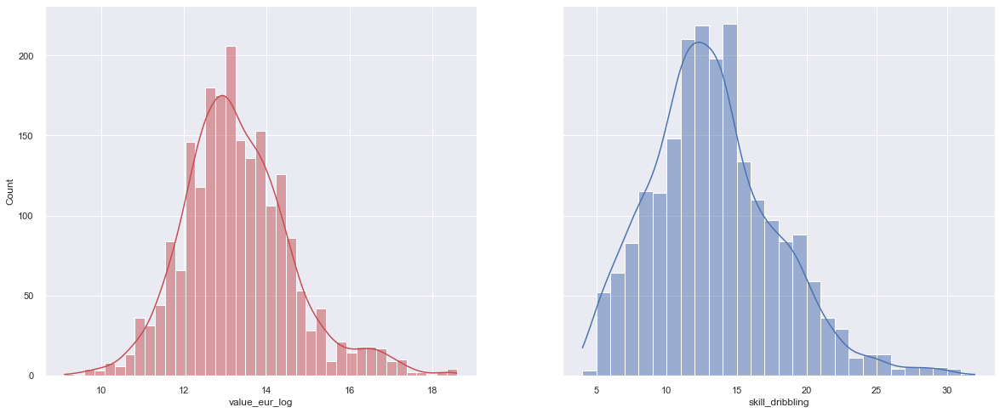

In [102]:
# Valores en Euros
fig, ax = plt.subplots(ncols=2, sharey=True)
sns.histplot(ax=ax[0], x=gk['value_eur_log'], kde=True, color='r');
sns.histplot(ax=ax[1], x=gk['skill_dribbling'], bins=28, kde=True);

Por ultimo, vamos a comparar nuestra poblacion de jugadores con la de porteros. En principio esperamos que las medias sean diferentes. Y como vemos, nuestro T-test falla, es decir tenemos medias diferentes para cada grupo y es algo logico, ya que un portero no tiene el mismo precio que un delantero.

In [103]:
ttest_ind(player['value_eur_log'], gk['value_eur_log'])

Ttest_indResult(statistic=23.81110591631626, pvalue=1.589152109688863e-123)

Por ultimo, se realizara un analisis entre el potencial de las muestras mencionadas. Como vemos se comporta como esperariamos, tenemos medias diferentes entre las poblaciones ya que en nuestra lista no tenemos ningun portero que se desempeñe al nivel de los grandes jugadores como Messi, Cristiano o Mbappe.

In [104]:
ttest_ind(player['potential'], gk['potential'])

Ttest_indResult(statistic=10.53391782327565, pvalue=7.093520857212154e-26)

##### Usamos Lasso para calcular la regresion lineal.

In [105]:
x = sm.add_constant(gk_small.drop(['value_eur_log'], axis=1))
y = gk['value_eur_log']

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=42)

# Iniciamos el modelo para estandarizar
ss = StandardScaler()

# Realizamos el fit para ambas muestras
z_train = ss.fit_transform(x_train)
z_test = ss.fit_transform(x_test)

# Transformamos z_train y z_test en Dataframes para poder usalor luego
z_train = pd.DataFrame(z_train, columns=x_train.columns)
z_test = pd.DataFrame(z_test, columns=x_test.columns)

In [106]:
# eps = alpha_min/alpha_max = 1e-3
lasso_model = LassoCV(eps=1e-3, n_alphas=200)

# Nuestra funciona de Lasso va a encontrar el mejor valor de alpha y va a eliminar las variable que no aporten al modelo o
# las que tengan mucha correlacion con otras. Por otro lado, nos realiza nuestra regresion lineal.
lasso_model = lasso_model.fit(z_train, y_train)

In [107]:
# Valor de alpha seleccionado
lasso_model.alpha_

0.0060625452628797856

In [108]:
# Coeficientes de nuestras variables predictoras
lasso_model.coef_

array([ 0.00000000e+00,  0.00000000e+00,  7.23118423e-01,  7.36637991e-02,
       -0.00000000e+00,  0.00000000e+00,  0.00000000e+00, -7.04892904e-04,
       -7.68243026e-04, -0.00000000e+00,  3.88782037e-04, -0.00000000e+00,
       -2.52212389e-02, -5.20621048e-02,  2.05371192e-01,  5.03896923e-02,
       -0.00000000e+00, -7.92501267e-02,  2.70163750e-01, -0.00000000e+00,
        3.51418749e-02, -5.61555666e-03,  0.00000000e+00,  1.59901593e-01])

In [109]:
predic_train_lasso = lasso_model.predict(z_train)
predic_test_lasso = lasso_model.predict(z_test)

rmse(y_train, predic_train_lasso)

0.2881807860331518

In [110]:
rmse(y_test, predic_test_lasso)

0.30727256412004184

In [111]:
r2(y_train, predic_train_lasso)

0.8361286703344496

In [112]:
r2(y_test, predic_test_lasso)

0.8209621811913091

Podemos ver la distribucion de los errores del modelo para los porteros. Vemos que tiene una distribucion semi-normal, ya que la cola derecha esta muy alargada.

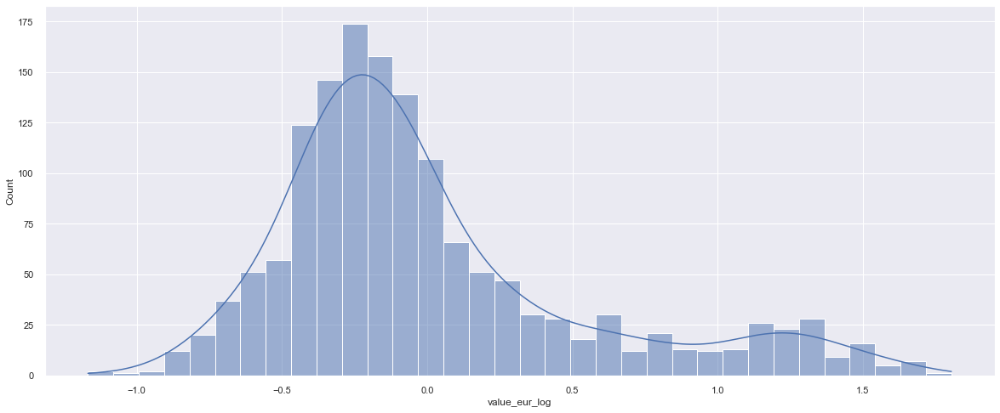

In [113]:
error_train_lasso = predic_train_lasso - y_train
sns.histplot(error_train_lasso, kde=True);

##### Vamos a generar el modelo de regresion con OLS lineal para asi observar los P-values. Usaremos solo las variables ponderadas por Lasso 

Verificaremos el modelo y ademas obtendremos los poncentajes de cambio de nustra variable dependiente a partir de variaciones de nuestra variable independiente.

In [114]:
name_var_gk = []
for i, j in zip(lasso_model.coef_, x_train.columns):
    if i != 0:
        name_var_gk.append(j)

In [115]:
modelo_gk_ols = sm.OLS(y_train, x_train.loc[:, ['const'] + list(name_var_gk)]).fit()
modelo_gk_ols.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          value_eur_log   R-squared:                       0.837
Model:                            OLS   Adj. R-squared:                  0.835
Method:                 Least Squares   F-statistic:                     539.2
Date:                Fri, 08 Oct 2021   Prob (F-statistic):               0.00
Time:                        22:26:54   Log-Likelihood:                -1180.6
No. Observations:                1486   AIC:                             2391.
Df Residuals:                    1471   BIC:                             2471.
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
=============================================================================================
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
const                      -132.2385     25.811     -5.123      0.000    -182.869     -81.608
potential                     0.1144      0.003     33.191      0.000       0.108       0.121
club_contract_valid_until     0.0657      0.013      5.139      0.000       0.041       0.091
skill_ball_control           -0.0011      0.003     -0.421      0.674      -0.006       0.004
movement_acceleration        -0.0009      0.002     -0.562      0.574      -0.004       0.002
movement_reactions            0.0017      0.002      0.724      0.469      -0.003       0.006
mentality_vision             -0.0026      0.001     -2.036      0.042      -0.005   -9.49e-05
mentality_composure          -0.0049      0.001     -3.291      0.001      -0.008      -0.002
goalkeeping_diving            0.0288      0.005      5.417      0.000       0.018       0.039
goalkeeping_handling          0.0120      0.005      2.505      0.012       0.003       0.021
goalkeeping_positioning      -0.0181      0.004     -4.272      0.000      -0.026      -0.010
goalkeeping_reflexes          0.0360      0.005      6.980      0.000       0.026       0.046
Position_GK                   0.0895      0.035      2.558      0.011       0.021       0.158
Club_Famous                  -0.0512      0.051     -0.995      0.320      -0.152       0.050
wage_eur_log                  0.1331      0.019      7.087      0.000       0.096       0.170
==============================================================================
Omnibus:                      252.874   Durbin-Watson:                   2.015
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              396.242
Skew:                          -1.168   Prob(JB):                     9.06e-87
Kurtosis:                       3.970   Cond. No.                     3.75e+06
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 3.75e+06. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Como vemos tenemos varias variables con un p-value mayor a 0.05, las cuales no estan proporcionando un aporte significativo a nuestro modelo asi que las eliminamos.

In [116]:
x_train_ols = x_train.loc[:, ['const'] + list(name_var_gk)]
x_train_ols.drop(['movement_reactions', 'skill_ball_control', 'movement_acceleration',
                  'Club_Famous'], axis=1, inplace=True)

In [117]:
modelo_gk_ols = sm.OLS(y_train, x_train_ols).fit()
predic_train_ols_gk = modelo_gk_ols.predict(x_train_ols)

modelo_gk_ols.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          value_eur_log   R-squared:                       0.837
Model:                            OLS   Adj. R-squared:                  0.836
Method:                 Least Squares   F-statistic:                     755.7
Date:                Fri, 08 Oct 2021   Prob (F-statistic):               0.00
Time:                        22:26:56   Log-Likelihood:                -1181.6
No. Observations:                1486   AIC:                             2385.
Df Residuals:                    1475   BIC:                             2443.
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
=============================================================================================
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
const                      -130.7714     25.726     -5.083      0.000    -181.234     -80.308
potential                     0.1140      0.003     33.820      0.000       0.107       0.121
club_contract_valid_until     0.0650      0.013      5.101      0.000       0.040       0.090
mentality_vision             -0.0025      0.001     -1.999      0.046      -0.005   -4.78e-05
mentality_composure          -0.0050      0.001     -3.492      0.000      -0.008      -0.002
goalkeeping_diving            0.0292      0.005      5.562      0.000       0.019       0.039
goalkeeping_handling          0.0122      0.005      2.567      0.010       0.003       0.022
goalkeeping_positioning      -0.0180      0.004     -4.311      0.000      -0.026      -0.010
goalkeeping_reflexes          0.0363      0.005      7.162      0.000       0.026       0.046
Position_GK                   0.0959      0.034      2.798      0.005       0.029       0.163
wage_eur_log                  0.1284      0.018      7.149      0.000       0.093       0.164
==============================================================================
Omnibus:                      251.638   Durbin-Watson:                   2.015
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              393.187
Skew:                          -1.166   Prob(JB):                     4.17e-86
Kurtosis:                       3.956   Cond. No.                     3.74e+06
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 3.74e+06. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [118]:
x_test_ols = x_test.loc[:, ['const'] + list(name_var_gk)]
x_test_ols.drop(['movement_reactions', 'skill_ball_control', 'movement_acceleration',
                  'Club_Famous'], axis=1, inplace=True)


predic_test_ols_gk = modelo_gk_ols.predict(x_test_ols)

In [119]:
r2(y_test, predic_test_ols_gk)

0.8217970145058767

In [120]:
rmse(y_test, predic_test_ols_gk)

0.30583978653770255

Por ultimo, vamos a ver los porcentajes de incremento de cada variable respecto a nuestra variable dependiente.

In [121]:
interpre = []
for i, j in zip(modelo_gk_ols.params.values, modelo_gk_ols.pvalues.index):
    if 'log' in j:
        # Esto se hace para nuestras variables independientes logaritmicas
        interpre.append((1.01**i - 1)*100)
    else:
        # Esto se hace para nuestras variables independientes que no estan transformadas
        interpre.append((np.exp(i) - 1) * 100)

gk_percent = pd.DataFrame(interpre, index=modelo_gk_ols.pvalues.index, columns=['% of Increase'])
var_value_gk = gk_percent[(gk_percent['% of Increase'] > 0) | (gk_percent['% of Increase'] < 0)].sort_values('% of Increase', ascending=False)
var_value_gk

,% of Increase
potential,12.071658
Position_GK,10.069809
club_contract_valid_until,6.716410
goalkeeping_reflexes,3.699761
goalkeeping_diving,2.958834
goalkeeping_handling,1.232408
wage_eur_log,0.127889
mentality_vision,-0.252173
mentality_composure,-0.495316
goalkeeping_positioning,-1.785022


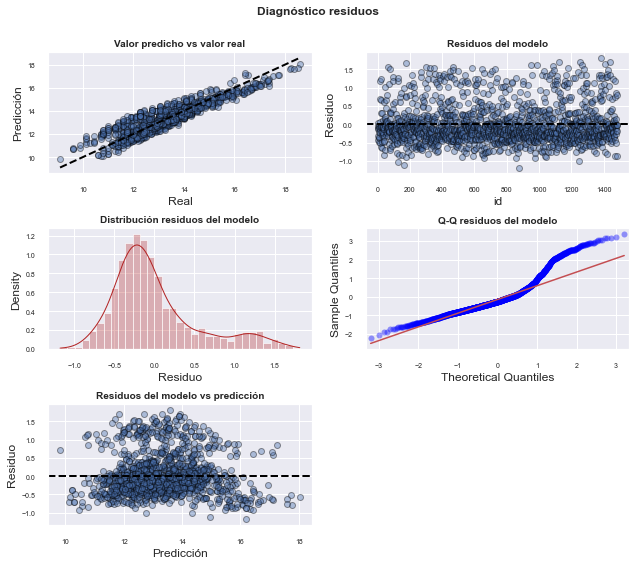

In [122]:
residuos_train = predic_train_ols_gk - y_train

fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(9, 8))

axes[0, 0].scatter(y_train, predic_train_ols_gk, edgecolors=(0, 0, 0), alpha = 0.4)
axes[0, 0].plot([y_train.min(), y_train.max()], [y_train.min(), y_train.max()],
                'k--', color = 'black', lw=2)
axes[0, 0].set_title('Valor predicho vs valor real', fontsize = 10, fontweight = "bold")
axes[0, 0].set_xlabel('Real')
axes[0, 0].set_ylabel('Predicción')
axes[0, 0].tick_params(labelsize = 7)

axes[0, 1].scatter(list(range(len(y_train))), residuos_train,
                   edgecolors=(0, 0, 0), alpha = 0.4)
axes[0, 1].axhline(y = 0, linestyle = '--', color = 'black', lw=2)
axes[0, 1].set_title('Residuos del modelo', fontsize = 10, fontweight = "bold")
axes[0, 1].set_xlabel('id')
axes[0, 1].set_ylabel('Residuo')
axes[0, 1].tick_params(labelsize = 7)

sns.histplot(
    data    = residuos_train,
    stat    = "density",
    kde     = True,
    line_kws= {'linewidth': 1},
    color   = "firebrick",
    alpha   = 0.3,
    ax      = axes[1, 0]
)

axes[1, 0].set_title('Distribución residuos del modelo', fontsize = 10,
                     fontweight = "bold")
axes[1, 0].set_xlabel("Residuo")
axes[1, 0].tick_params(labelsize = 7)


sm.qqplot(
    residuos_train,
    fit   = True,
    line  = 'q',
    ax    = axes[1, 1], 
    color = 'firebrick',
    alpha = 0.4,
    lw    = 2
)
axes[1, 1].set_title('Q-Q residuos del modelo', fontsize = 10, fontweight = "bold")
axes[1, 1].tick_params(labelsize = 7)

axes[2, 0].scatter(predic_train_ols_gk, residuos_train,
                   edgecolors=(0, 0, 0), alpha = 0.4)
axes[2, 0].axhline(y = 0, linestyle = '--', color = 'black', lw=2)
axes[2, 0].set_title('Residuos del modelo vs predicción', fontsize = 10, fontweight = "bold")
axes[2, 0].set_xlabel('Predicción')
axes[2, 0].set_ylabel('Residuo')
axes[2, 0].tick_params(labelsize = 7)

# Se eliminan los axes vacíos
fig.delaxes(axes[2,1])

fig.tight_layout()
plt.subplots_adjust(top=0.9)
fig.suptitle('Diagnóstico residuos', fontsize = 12, fontweight = "bold");